In [1]:
!pip install copent

In [1]:
!pip install GPy

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
     -- ------------------------------------- 0.1/1.6 MB 1.7 MB/s eta 0:00:01
     ------- -------------------------------- 0.3/1.6 MB 3.2 MB/s eta 0:00:01
     ----------------- ---------------------- 0.7/1.6 MB 5.0 MB/s eta 0:00:01
     ---------------------------------------  1.6/1.6 MB 8.7 MB/s eta 0:00:01
     ---------------------------------------- 1.6/1.6 MB 8.0 MB/s eta 0:00:00
     ---------------------------------------- 0.0/103.2 kB ? eta -:--:--
     -------------------------------------- 103.2/103.2 kB 5.8 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import GPy
import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.varmax import VARMAX
from copent import transent

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.gaussian_process import GaussianProcessRegressor

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, LSTM, Embedding
from keras.callbacks import EarlyStopping, LearningRateScheduler
from keras.losses import MeanSquaredError, Huber
from keras.optimizers import Adam
from keras.metrics import MeanAbsoluteError

import torch
from torch import nn, optim

from itertools import product
import pickle as pkl
from tqdm.notebook import tqdm

%matplotlib inline

In [ ]:
strategy = tf.distribute.MirroredStrategy()

## Import data and preprocessing

In [4]:
data = pd.read_csv('/kaggle/input/weather-data-munich-1954-2022/weatherdata.csv', sep=';')
data.columns = data.columns.str.strip()
data.head()

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK,eor
0,3379,19540601,-999,-999.0,-999.0,1,0.0,1,-999.0,0,-999.0,-999.0,-999.0,14.0,-999.0,17.6,10.4,-999.0,eor
1,3379,19540602,-999,-999.0,-999.0,1,0.5,1,-999.0,0,-999.0,-999.0,-999.0,13.2,-999.0,19.7,9.7,-999.0,eor
2,3379,19540603,-999,-999.0,-999.0,1,0.0,1,-999.0,0,-999.0,-999.0,-999.0,16.6,-999.0,21.9,8.2,-999.0,eor
3,3379,19540604,-999,-999.0,-999.0,1,1.2,1,-999.0,0,-999.0,-999.0,-999.0,15.2,-999.0,17.3,11.8,-999.0,eor
4,3379,19540605,-999,-999.0,-999.0,1,6.0,1,-999.0,0,-999.0,-999.0,-999.0,15.2,-999.0,17.7,13.7,-999.0,eor


In [5]:
data['MESS_DATUM'] = data['MESS_DATUM'].astype(str)
data['MESS_DATUM'] = data['MESS_DATUM'].apply(lambda x: x[-2:] + '/' +  x[-4:-2] + '/' + x[:4])
data['MESS_DATUM'] = pd.to_datetime(data['MESS_DATUM'], format="%d/%m/%Y")
data['MESS_DATUM'].head()

0   1954-06-01
1   1954-06-02
2   1954-06-03
3   1954-06-04
4   1954-06-05
Name: MESS_DATUM, dtype: datetime64[ns]

In [6]:
data.describe()

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
count,25051.0,25051,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000
mean,3379.0,1988-09-15 00:00:00,-440.069458,-443.776775,-446.922051,5.661530,2.627951,2.686679,-7.370731,-61.539899,-443.378979,-440.455842,83.229992,9.612083,-405.123415,13.828729,5.658369,-443.437691
min,3379.0,1954-06-01 00:00:00,-999.000000,-999.000000,-999.000000,1.000000,0.000000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-20.000000,-999.000000,-17.900000,-25.400000,-999.000000
25%,3379.0,1971-07-24 12:00:00,-999.000000,-999.000000,-999.000000,1.000000,0.000000,0.000000,0.400000,0.000000,-999.000000,-999.000000,-999.000000,3.400000,-999.000000,6.700000,0.500000,-999.000000
50%,3379.0,1988-09-15 00:00:00,10.000000,4.900000,1.200000,9.000000,0.000000,1.000000,3.900000,0.000000,1.300000,4.700000,945.000000,9.900000,54.000000,14.200000,5.900000,-4.200000
75%,3379.0,2005-11-07 12:00:00,10.000000,8.900000,2.400000,10.000000,2.600000,6.000000,8.300000,0.000000,6.200000,9.500000,956.400000,15.800000,76.000000,20.900000,11.400000,6.200000
max,3379.0,2022-12-31 00:00:00,10.000000,38.600000,11.000000,10.000000,101.600000,8.000000,15.717000,55.000000,8.000000,21.500000,979.600000,30.400000,100.000000,37.500000,22.600000,21.400000
std,0.0,NaN,501.479739,501.633240,498.138980,4.318503,5.911350,2.880991,110.177292,242.190168,499.278507,501.344036,971.398000,7.908055,533.140985,9.013736,7.036732,499.129425


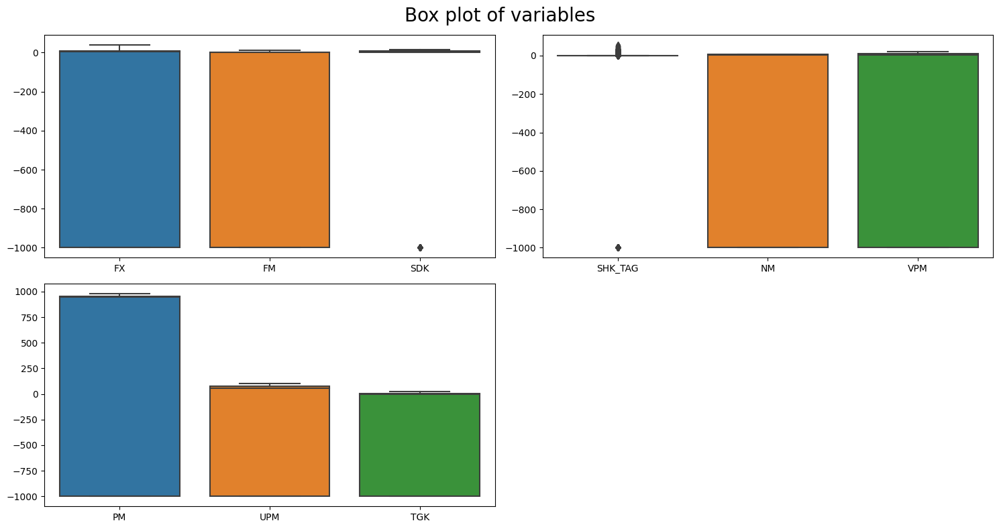

In [7]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(2, 2, 1)
sns.boxplot(data[['FX', 'FM', 'SDK']])

plt.subplot(2, 2, 2)
sns.boxplot(data[['SHK_TAG', 'NM', 'VPM']])

plt.subplot(2, 2, 3)
sns.boxplot(data[['PM', 'UPM', 'TGK']])

plt.tight_layout()
plt.show()

In [8]:
data['FM'].replace(-999, -1, inplace=True)
data['PM'].replace(-999, -1, inplace=True)
data['VPM'].replace(-999, -1, inplace=True)
data['UPM'].replace(-999, -1, inplace=True)
data['FX'].replace(-999, -1, inplace=True)
data['SDK'].replace(-999, -1, inplace=True)
data['NM'].replace(-999, -1, inplace=True)
data['TGK'].replace(-999, -1, inplace=True)

data.drop(columns=['QN_3', 'SHK_TAG', 'STATIONS_ID', 'QN_4', 'RSK', 'RSKF', 'eor'], inplace=True)

data.describe()

,MESS_DATUM,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
count,25051,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000
mean,1988-09-15 00:00:00,4.727636,0.944940,4.780082,2.456237,4.821632,528.507466,9.612083,40.154059,13.828729,5.658369,2.278009
min,1954-06-01 00:00:00,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-20.000000,-1.000000,-17.900000,-25.400000,-23.500000
25%,1971-07-24 12:00:00,-1.000000,-1.000000,0.400000,-1.000000,-1.000000,-1.000000,3.400000,-1.000000,6.700000,0.500000,-1.000000
50%,1988-09-15 00:00:00,4.900000,1.200000,3.900000,1.300000,4.700000,945.000000,9.900000,54.000000,14.200000,5.900000,-1.000000
75%,2005-11-07 12:00:00,8.900000,2.400000,8.300000,6.200000,9.500000,956.400000,15.800000,76.000000,20.900000,11.400000,6.200000
max,2022-12-31 00:00:00,38.600000,11.000000,15.717000,8.000000,21.500000,979.600000,30.400000,100.000000,37.500000,22.600000,21.400000
std,NaN,6.076875,1.993331,4.383838,3.570336,6.036319,475.305209,7.908055,38.251542,9.013736,7.036732,6.027918


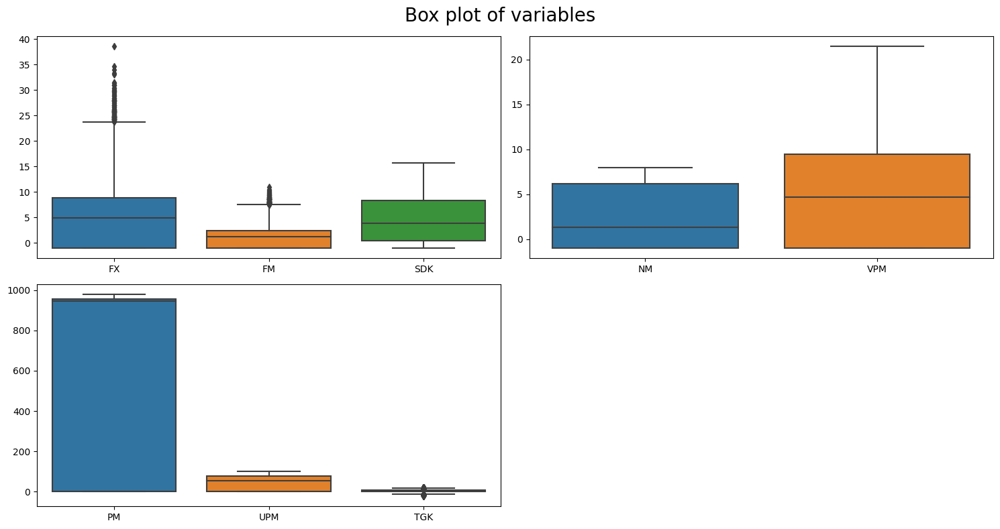

In [9]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(2, 2, 1)
sns.boxplot(data[['FX', 'FM', 'SDK']])

plt.subplot(2, 2, 2)
sns.boxplot(data[['NM', 'VPM']])

plt.subplot(2, 2, 3)
sns.boxplot(data[['PM', 'UPM', 'TGK']])

plt.tight_layout()
plt.show()

In [10]:
#data.to_csv('weather.csv')

In [11]:
df_2020 = data[data['MESS_DATUM'] >= '01/01/2018'].reset_index(drop=True)

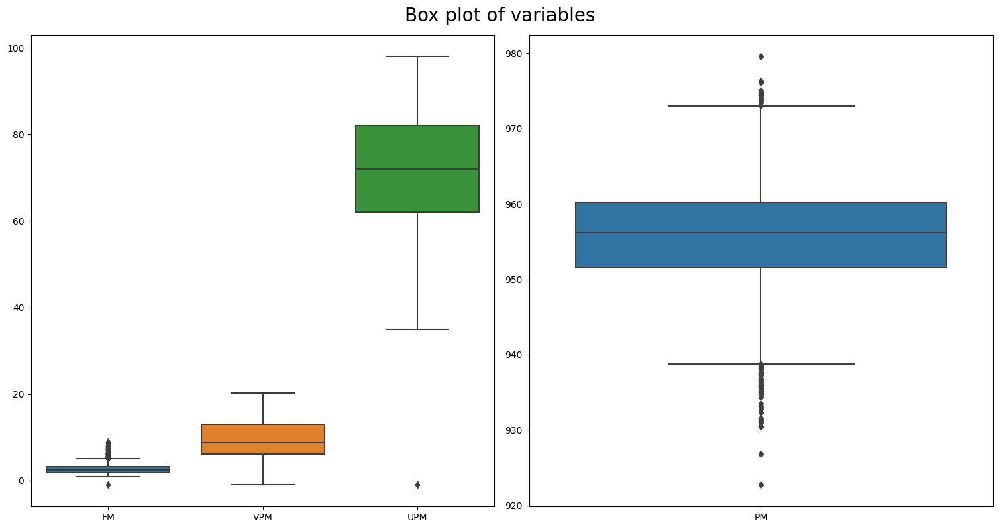

In [12]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(1, 2, 1)
sns.boxplot(df_2020[['FM', 'VPM', 'UPM']])

plt.subplot(1, 2, 2)
sns.boxplot(df_2020[['PM']])

plt.tight_layout()
plt.show()

## Data visualization

In [13]:
def plot_ts(data, label):
    sns.lineplot(data=data, x='MESS_DATUM', y=label)
    plt.title(label)
    plt.ylabel('')
    plt.xlabel('')

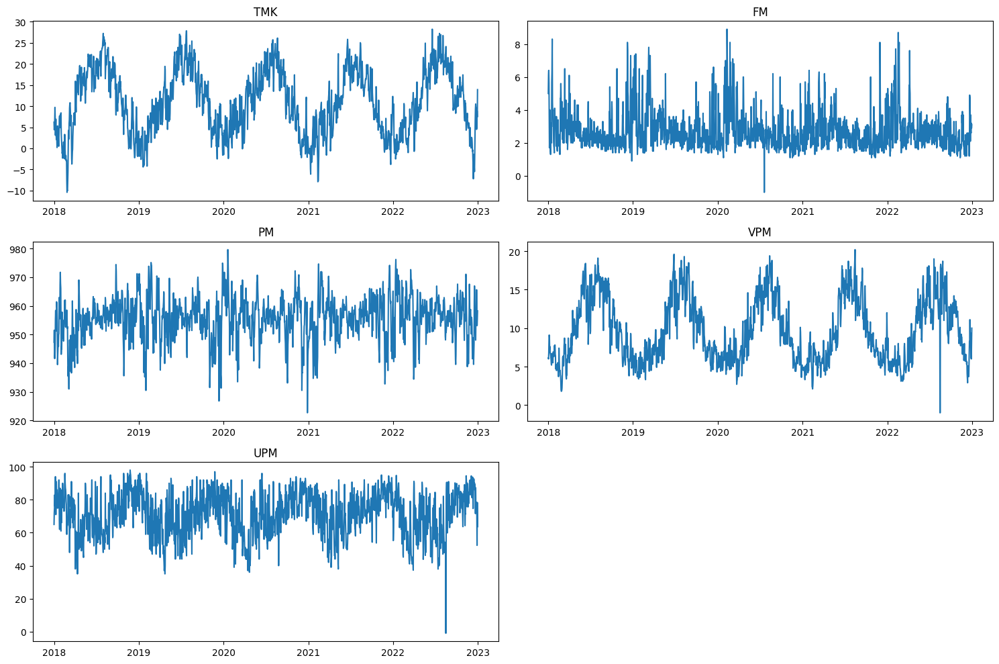

In [14]:
plt.figure(figsize=(15, 10))

cols = ['TMK', 'FM', 'PM', 'VPM', 'UPM']

for i in range(5):
    plt.subplot(3, 2, i + 1)
    plot_ts(df_2020, cols[i])

plt.tight_layout()
plt.show()

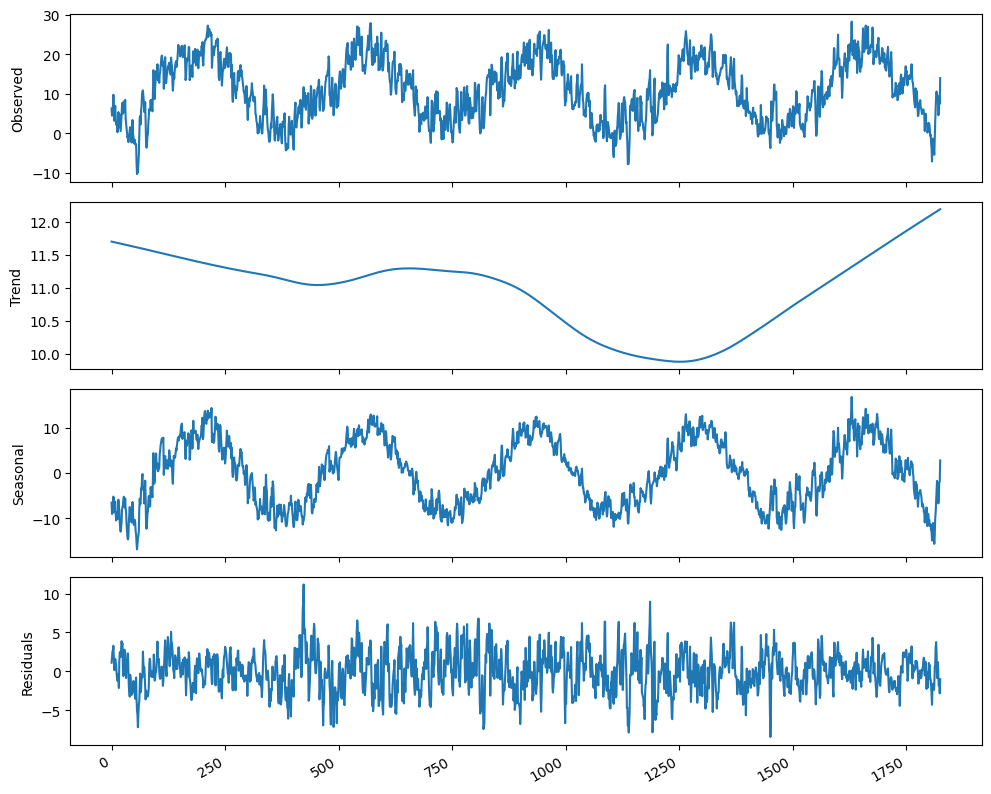

In [15]:
decomposition = STL(df_2020['TMK'], period=365).fit()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10,8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

fig.autofmt_xdate()
plt.tight_layout()

## Split & Scale data

In [16]:
print(len(df_2020))
print(len(df_2020) * 0.8)

1826
1460.8000000000002


In [17]:
train_df = df_2020[:1460].drop(columns=['MESS_DATUM']).reset_index(drop=True)
test_df = df_2020[1460:].drop(columns=['MESS_DATUM']). reset_index(drop=True)

In [18]:
scalers={}

scaled_train = train_df.copy()
for i in train_df.columns:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    s_s = scaler.fit_transform(scaled_train[i].values.reshape(-1,1))
    s_s = np.reshape(s_s,len(s_s))
    scalers['scaler_'+ i] = scaler
    scaled_train[i]=s_s
    
scaled_test = test_df.copy()
for i in test_df.columns:
    scaler = scalers['scaler_'+i]
    s_s = scaler.transform(scaled_test[i].values.reshape(-1,1))
    s_s=np.reshape(s_s,len(s_s))
    scalers['scaler_'+i] = scaler
    scaled_test[i]=s_s

## SARIMAX

In [19]:
target = scaled_train['TMK']
exog = scaled_train.drop(columns=['TMK'])

In [20]:
ad_fuller_result = adfuller(target)

print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

ADF Statistic: -2.6298047446318438
p-value: 0.08699235099909725


In [21]:
target_diff = target.diff()

ad_fuller_result = adfuller(target_diff[1:])

print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

ADF Statistic: -15.058107567960825
p-value: 9.08757171031762e-28


### Find the optimize hyperparameters

In [22]:
def optimize_SARIMAX(endog: Union[pd.Series, list], exog: Union[pd.Series, list], order_list: list, d: int, D: int, s: int) -> pd.DataFrame:
    
    results = []
    
    for order in tqdm_notebook(order_list):
        try: 
            model = SARIMAX(
                endog,
                exog,
                order=(order[0], d, order[1]),
                seasonal_order=(order[2], D, order[3], s),
                simple_differencing=False).fit(disp=False)
        except:
            continue
            
        aic = model.aic
        results.append([order, aic])
        print(results)
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['(p,q,P,Q)', 'AIC']
    
    #Sort in ascending order, lower AIC is better
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [23]:
p = range(0, 2, 1)
d = 1
q = range(0, 2, 1)
P = range(0, 2, 1)
D = 0
Q = range(0, 2, 1)
s = 365

parameters = product(p, q, P, Q)
parameters_list = list(parameters)

In [ ]:
result_df = optimize_SARIMAX(target, exog, parameters_list, d, D, s)
result_df

  0%|          | 0/16 [00:00<?, ?it/s]

,"(p,q,P,Q)",AIC
0,"(0, 1, 0, 1)",-3573.037856
1,"(0, 1, 0, 0)",-3567.895655
2,"(1, 1, 0, 0)",-3558.605184
3,"(1, 0, 0, 0)",-3428.029242
4,"(1, 0, 1, 1)",-3424.054362
5,"(0, 0, 0, 0)",-3307.123578
6,"(0, 0, 1, 0)",-3305.170192
7,"(0, 0, 0, 1)",-3305.168906
8,"(0, 0, 1, 1)",-3303.169810


### Model training

In [25]:
start = time.time()
best_model = SARIMAX(target, exog, order=(0,1,1), seasonal_order=(0,0,1,365), simple_differencing=False)
best_model_fit = best_model.fit(disp=False)
end = time.time()
print(best_model_fit.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                 TMK   No. Observations:                 1460
Model:             SARIMAX(0, 1, 1)x(0, 0, 1, 365)   Log Likelihood                3049.739
Date:                             Thu, 14 Nov 2024   AIC                          -6073.477
Time:                                     06:54:06   BIC                          -6004.766
Sample:                                          0   HQIC                         -6047.844
                                            - 1460                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
FX            -0.0159      0.005     -2.905      0.004      -0.027      -0.005
FM             0.0146      

In [26]:
print(end-start)

8231.490133285522


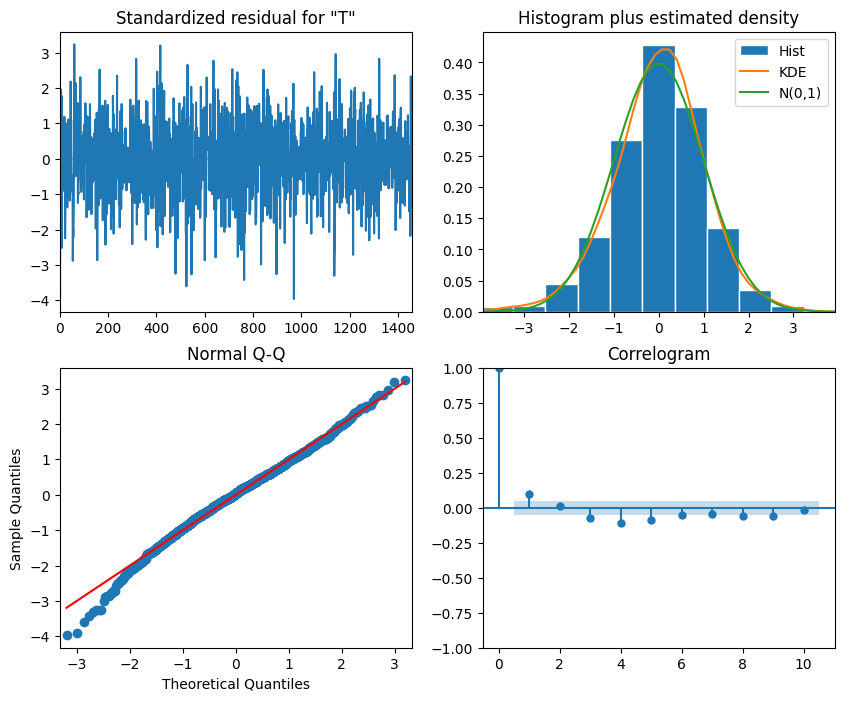

In [27]:
best_model_fit.plot_diagnostics(figsize=(10,8));

In [28]:
def recursive_forecast(endog: Union[pd.Series, list], exog: Union[pd.Series, list], train_len: int, horizon: int, window: int, method: str) -> list:
    
    total_len = train_len + horizon

    if method == 'last':
        pred_last_value = []
        
        for i in range(train_len, total_len, window):
            last_value = endog[:i].iloc[-1]
            pred_last_value.extend(last_value for _ in range(window))
            
        return pred_last_value
    
    elif method == 'SARIMAX':
        pred_SARIMAX = []
        
        for i in range(train_len, total_len, window):
            #model = SARIMAX(endog[:i], exog[:i], order=(0,1,1), seasonal_order=(0,0,1,365), simple_differencing=False)
            #res = model.fit(disp=False)
            predictions = best_model_fit.get_prediction(exog=exog)
            oos_pred = predictions.predicted_mean.iloc[-window:]
            pred_SARIMAX.extend(oos_pred)
            
        return pred_SARIMAX

In [29]:
target_train = scaled_train['TMK']
target_test = scaled_test['TMK']

pred_df = pd.DataFrame({'actual': target_test})

TRAIN_LEN = len(target_train)
HORIZON = len(target_test)
WINDOW = 365

In [30]:
pred_last_value = recursive_forecast(target, exog, TRAIN_LEN, HORIZON, WINDOW, 'last')
pred_SARIMAX = recursive_forecast(target, exog, TRAIN_LEN, HORIZON, WINDOW, 'SARIMAX')

In [31]:
pred_df['pred_last_value'] = pred_last_value[:HORIZON]
pred_df['pred_SARIMAX'] = pred_SARIMAX[:HORIZON]

pred_df.head()

,actual,pred_last_value,pred_SARIMAX
0,0.188482,0.183246,-0.362508
1,-0.010471,0.183246,-0.433096
2,0.041885,0.183246,-0.529158
3,0.083770,0.183246,-0.494583
4,0.094241,0.183246,-0.496810


### Model Evaluation
#### Scaled data

In [32]:
mse_last = mean_squared_error(pred_df.actual, pred_df.pred_last_value)
mse_SARIMAX = mean_squared_error(pred_df.actual, pred_df.pred_SARIMAX)

print(mse_last, mse_SARIMAX)

0.16038912687988038 0.07031758629965747


In [33]:
rmse_last = mean_squared_error(pred_df.actual, pred_df.pred_last_value, squared=False)
rmse_SARIMAX = mean_squared_error(pred_df.actual, pred_df.pred_SARIMAX, squared=False)

print(rmse_last, rmse_SARIMAX)

0.40048611321727545 0.2651746335901258


In [34]:
mae_last = mean_absolute_error(pred_df.actual, pred_df.pred_last_value)
mae_SARIMAX = mean_absolute_error(pred_df.actual, pred_df.pred_SARIMAX)

print(mae_last, mae_SARIMAX)

0.3407289789145424 0.20982154329433667


In [35]:
r2_last = r2_score(pred_df.actual, pred_df.pred_last_value)
r2_SARIMAX = r2_score(pred_df.actual, pred_df.pred_SARIMAX)

print(r2_last, r2_SARIMAX)

-0.011907665912520127 0.5563607957141736


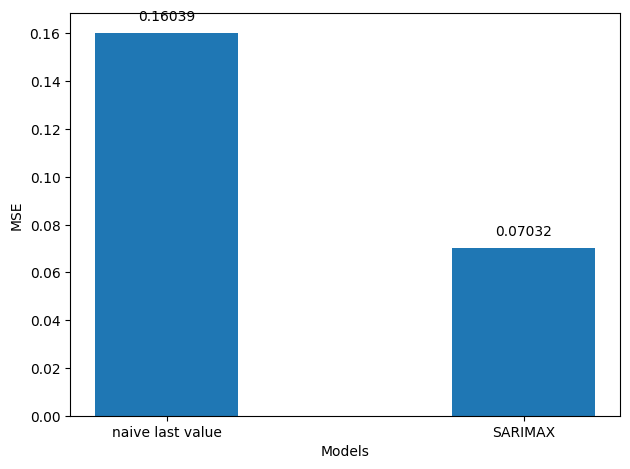

In [36]:
fig, ax = plt.subplots()

x = ['naive last value', 'SARIMAX']
y = [mse_last, mse_SARIMAX]

ax.bar(x, y, width=0.4)
ax.set_xlabel('Models')
ax.set_ylabel('MSE')

for index, value in enumerate(y):
    plt.text(x=index, y=value + 0.005, s=str(round(value,5)), ha='center')

plt.tight_layout()
plt.show()

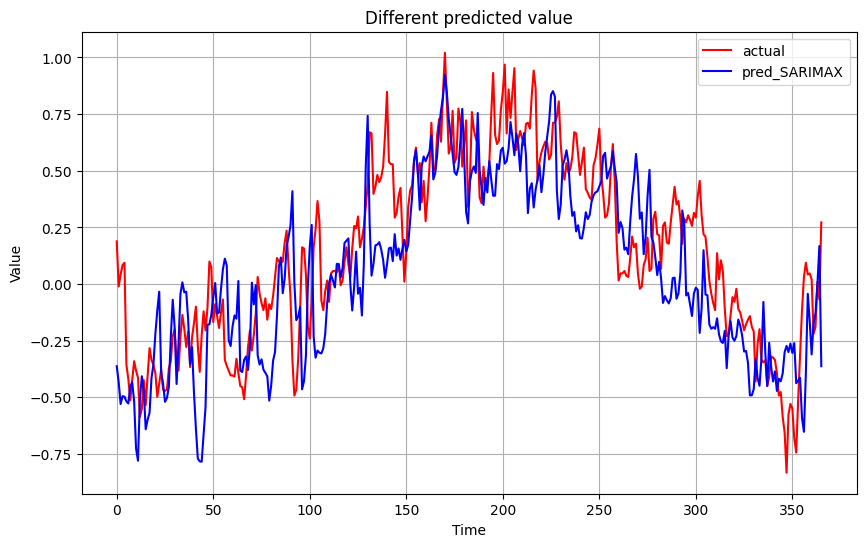

In [37]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=pred_df, x=pred_df.index, y='actual', label='actual', color='red')
sns.lineplot(data=pred_df, x=pred_df.index, y='pred_SARIMAX', label='pred_SARIMAX', color='blue')

plt.title('Different predicted value')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

#### Unscaled data

In [38]:
unscaled_SARIMAX = scalers['scaler_TMK'].inverse_transform(np.array(pred_SARIMAX[:HORIZON]).reshape(-1,1))

In [39]:
mse_SARIMAX = mean_squared_error(df_2020.loc[1460:, 'TMK'].values, unscaled_SARIMAX)
rmse_SARIMAX = mean_squared_error(df_2020.loc[1460:, 'TMK'].values, unscaled_SARIMAX, squared=False)
mae_SARIMAX = mean_absolute_error(df_2020.loc[1460:, 'TMK'].values, unscaled_SARIMAX)
pred_df['real'] = df_2020.loc[1460:, 'TMK'].values
pred_df['unscaled_SARIMAX'] = unscaled_SARIMAX

print(mse_SARIMAX, rmse_SARIMAX, mae_SARIMAX)

25.652558657978048 5.0648355015714035 4.0075914769218315


In [40]:
pred_df.head()

,actual,pred_last_value,pred_SARIMAX,real,unscaled_SARIMAX
0,0.188482,0.183246,-0.362508,12.3,1.776103
1,-0.010471,0.183246,-0.433096,8.5,0.427864
2,0.041885,0.183246,-0.529158,9.5,-1.406922
3,0.083770,0.183246,-0.494583,10.3,-0.746529
4,0.094241,0.183246,-0.496810,10.5,-0.789065


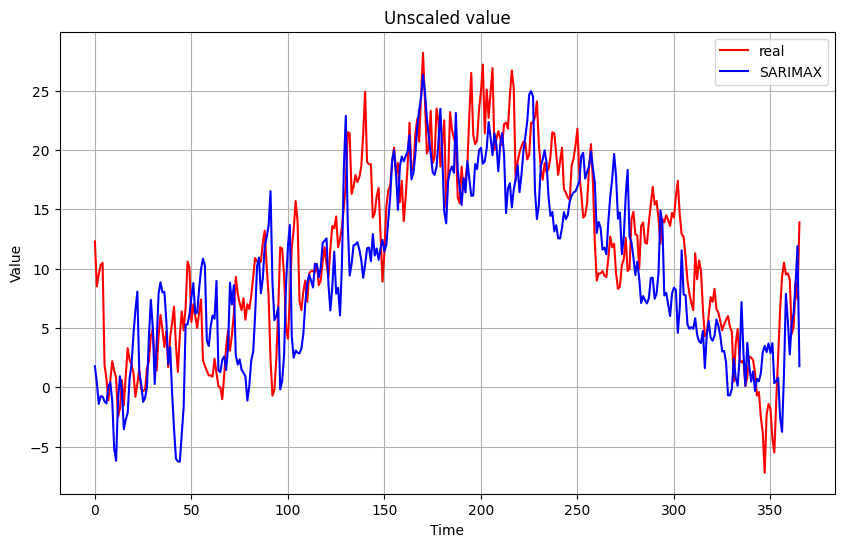

In [41]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=pred_df, x=pred_df.index, y='real', label='real', color='red')
sns.lineplot(data=pred_df, x=pred_df.index, y='unscaled_SARIMAX', label='SARIMAX', color='blue')

plt.title('Unscaled value')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

## Gaussian Process

In [42]:
statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
FX,-6.830838,0.00000
FM,-8.127475,0.00000
SDK,-3.784396,0.00307
NM,-7.663985,0.00000
VPM,-2.536297,0.10689
PM,-12.241508,0.00000
TMK,-2.629805,0.08699
UPM,-3.422825,0.01020
TXK,-2.883903,0.04725
TNK,-2.502936,0.11476


In [43]:
diff_data = scaled_train.diff()
diff_data = diff_data.iloc[1:, :]

statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(diff_data[diff_data.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=diff_data.columns)
ADF_res

,Statistic,P-value
FX,-12.580669,0.0
FM,-12.515880,0.0
SDK,-12.764731,0.0
NM,-13.270070,0.0
VPM,-14.361195,0.0
PM,-13.843815,0.0
TMK,-15.058108,0.0
UPM,-12.554024,0.0
TXK,-15.218893,0.0
TNK,-15.334696,0.0


### Define model and training

In [44]:
train_Gaussian = diff_data
test_Gaussian = scaled_test

In [45]:
X_train = train_Gaussian.index.values.reshape(-1, 1)
y_train = train_Gaussian.values

X_test = test_Gaussian.index.values.reshape(-1, 1)
y_test = test_Gaussian.values

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1459, 1) (1459, 11) (366, 1) (366, 11)


In [46]:
from sklearn.gaussian_process.kernels import RBF, ExpSineSquared, RationalQuadratic, WhiteKernel, ConstantKernel as C

kernel = (C(10.0, (1e-3, 1e3)) * RBF(length_scale=30.0) + 
          C(5.0, (1e-3, 1e3)) * RBF(length_scale=60.0) * ExpSineSquared(length_scale=1.0, periodicity=365.25) + 
          C(5.0, (1e-3, 1e3)) * RationalQuadratic(alpha=1.0, length_scale=1.0))

In [47]:
start = time.time()
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
gp.fit(X_train, y_train)
end = time.time()

In [48]:
gp

GaussianProcessRegressor(kernel=3.16**2 * RBF(length_scale=30) + 2.24**2 * RBF(length_scale=60) * ExpSineSquared(length_scale=1, periodicity=365) + 2.24**2 * RationalQuadratic(alpha=1, length_scale=1),
                         n_restarts_optimizer=10)

In [49]:
print(end-start)

767.621999502182


In [50]:
print(gp.score(X_train, y_train))

1.0


In [51]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(train_df.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [52]:
y_pred, sigma = gp.predict(X_test, return_std=True)
last_value = scaled_train.iloc[-1, :].values
y_pred = y_pred.cumsum(axis=0) + last_value

In [53]:
y_pred_unscale = unscale(y_pred)
sigma_unscale = unscale(sigma)

In [54]:
pred_scaled_Gau = pd.DataFrame(data=y_pred, columns=df_2020.drop(columns=['MESS_DATUM']).columns)
pred_scaled_Gau.head()

,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
0,-0.152941,0.151515,-0.955414,0.933333,0.108696,0.263620,0.183246,0.568889,0.013825,0.396552,0.463977
1,-0.123529,0.373737,-1.159236,1.244444,0.097826,0.411248,0.089005,0.791111,-0.041475,0.367816,0.556196
2,0.305882,0.434343,-1.197452,1.288889,0.173913,0.098418,0.141361,0.886349,0.294931,0.362069,0.608069
3,0.011765,0.272727,-1.222930,1.311111,0.347826,0.063269,0.214660,1.140317,0.170507,0.431034,0.700288
4,-0.405882,-0.070707,-0.789809,1.288889,0.434783,0.105448,0.366492,0.918095,0.221198,0.591954,0.734870


In [55]:
pred_Gau = pd.DataFrame(y_pred_unscale, columns=df_2020.drop(columns=['MESS_DATUM']).columns)
pred_Gau.head()

,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
0,13.4,4.7,0.35,7.7,12.0,958.65,12.2,84.42,13.9,10.9,10.0
1,13.9,5.8,-1.25,9.1,11.9,962.85,10.4,91.42,12.7,10.4,11.6
2,21.2,6.1,-1.55,9.3,12.6,953.95,11.4,94.42,20.0,10.3,12.5
3,16.2,5.3,-1.75,9.4,14.2,952.95,12.8,102.42,17.3,11.5,14.1
4,9.1,3.6,1.65,9.3,15.0,954.15,15.7,95.42,18.4,14.3,14.7


### Model Evaluation
#### Scaled data

In [56]:
for i in range(11):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(scaled_test, pred_scaled_Gau)}')

MSE for FX: 0.22800026416900884
MSE for FM: 0.10385803149664882
MSE for SDK: 0.6134267535676748
MSE for NM: 0.7001362741996237
MSE for VPM: 0.5813432259098231
MSE for PM: 0.23119864729016806
MSE for TMK: 0.17782997420504865
MSE for UPM: 0.7586566036603137
MSE for TXK: 0.16803461423599866
MSE for TNK: 0.263581696531086
MSE for TGK: 0.45546256737785007
MSE total: 0.3892298775130222


In [57]:
for i in range(11):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(scaled_test, pred_scaled_Gau, squared=False)}')

RMSE for FX: 0.47749373207300727
RMSE for FM: 0.322270121942213
RMSE for SDK: 0.7832156494655063
RMSE for NM: 0.8367414619819097
RMSE for VPM: 0.7624586716077293
RMSE for PM: 0.48083120457200784
RMSE for TMK: 0.42169891416157174
RMSE for UPM: 0.871008957279036
RMSE for TXK: 0.40992025350792155
RMSE for TNK: 0.5134020807623261
RMSE for TGK: 0.6748796688135227
RMSE total: 0.5958109741969774


In [58]:
for i in range(11):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(scaled_test, pred_scaled_Gau)}')

MAE for FX: 0.3979106390814297
MAE for FM: 0.22271899300113726
MAE for SDK: 0.6400375899309166
MAE for NM: 0.6875531265772667
MAE for VPM: 0.6954442855660764
MAE for PM: 0.40448874900454845
MAE for TMK: 0.3495837263562621
MAE for UPM: 0.7398152481940706
MAE for TXK: 0.33173427978149894
MAE for TNK: 0.45400728568894305
MAE for TGK: 0.6252814911951575
MAE total: 0.5044159467615734


#### Unscaled data

In [59]:
for i in range(11):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(test_df, pred_Gau)}')

MSE for FX: 65.89207634484356
MSE for FM: 2.544781416746637
MSE for SDK: 37.80089012172404
MSE for NM: 14.177759552542378
MSE for VPM: 49.2048906410074
MSE for PM: 187.13276311328013
MSE for TMK: 64.8741528897438
MSE for UPM: 752.7770149819464
MSE for TXK: 79.12581949758942
MSE for TNK: 79.80199444175156
MSE for TGK: 137.1044806884989
MSE total: 133.6760566990613


In [60]:
for i in range(11):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(test_df, pred_Gau, squared=False)}')

RMSE for FX: 8.117393445241124
RMSE for FM: 1.595237103613954
RMSE for SDK: 6.148242848304224
RMSE for NM: 3.7653365789185935
RMSE for VPM: 7.014619778791107
RMSE for PM: 13.679647770073618
RMSE for TMK: 8.05444926048602
RMSE for UPM: 27.436782154289638
RMSE for TXK: 8.895269501121899
RMSE for TNK: 8.933196205264473
RMSE for TGK: 11.70916225391462
RMSE total: 9.577212445456297


In [61]:
for i in range(11):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(test_df, pred_Gau)}')

MAE for FX: 6.764480864384305
MAE for FM: 1.1024590153556295
MAE for SDK: 5.024295080957696
MAE for NM: 3.0939890695977
MAE for VPM: 6.398087427207903
MAE for PM: 11.507704909179399
MAE for TMK: 6.6770491734046065
MAE for UPM: 23.304180318113225
MAE for TXK: 7.198633871258526
MAE for TNK: 7.899726770987608
MAE for TGK: 10.848633872235986
MAE total: 8.165385488425692


In [62]:
for i in range(11):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'R2 total: {r2_score(test_df, pred_Gau)}')

R2 for FX: -2.657560156780149
R2 for FM: -0.9490097254836467
R2 for SDK: -0.6338631522824543
R2 for NM: -1.501719617939453
R2 for VPM: -1.888070997754558
R2 for PM: -2.7906821513064495
R2 for TMK: -0.12194334882739177
R2 for UPM: -2.353768642132772
R2 for TXK: 0.0041894332067812234
R2 for TNK: -0.820893746100918
R2 for TGK: -1.9194847201711056
R2 total: -1.4211642568701925


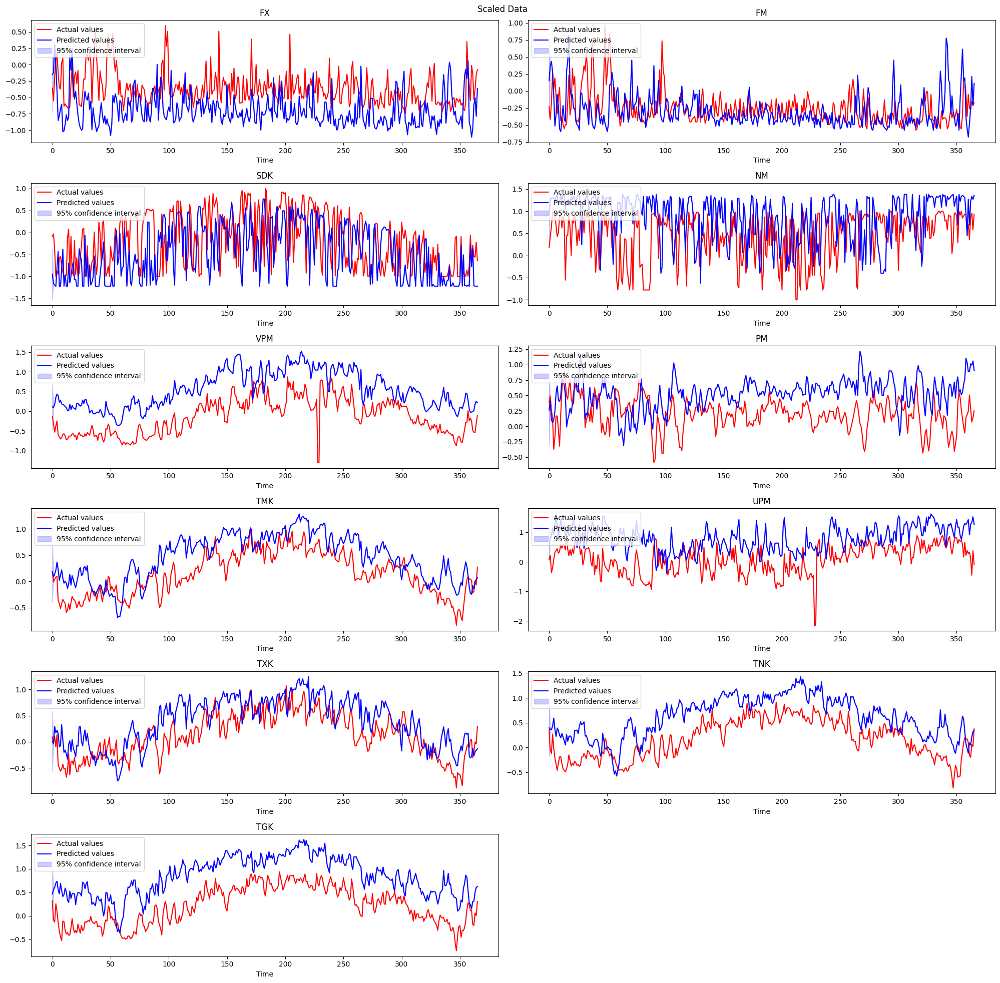

In [63]:
plt.figure(figsize=(20, 20))
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(X_test, y_test[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, y_pred[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), y_pred[:, i] - 1.96 * sigma[:, i], y_pred[:, i] + 1.96 * sigma[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{scaled_test.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

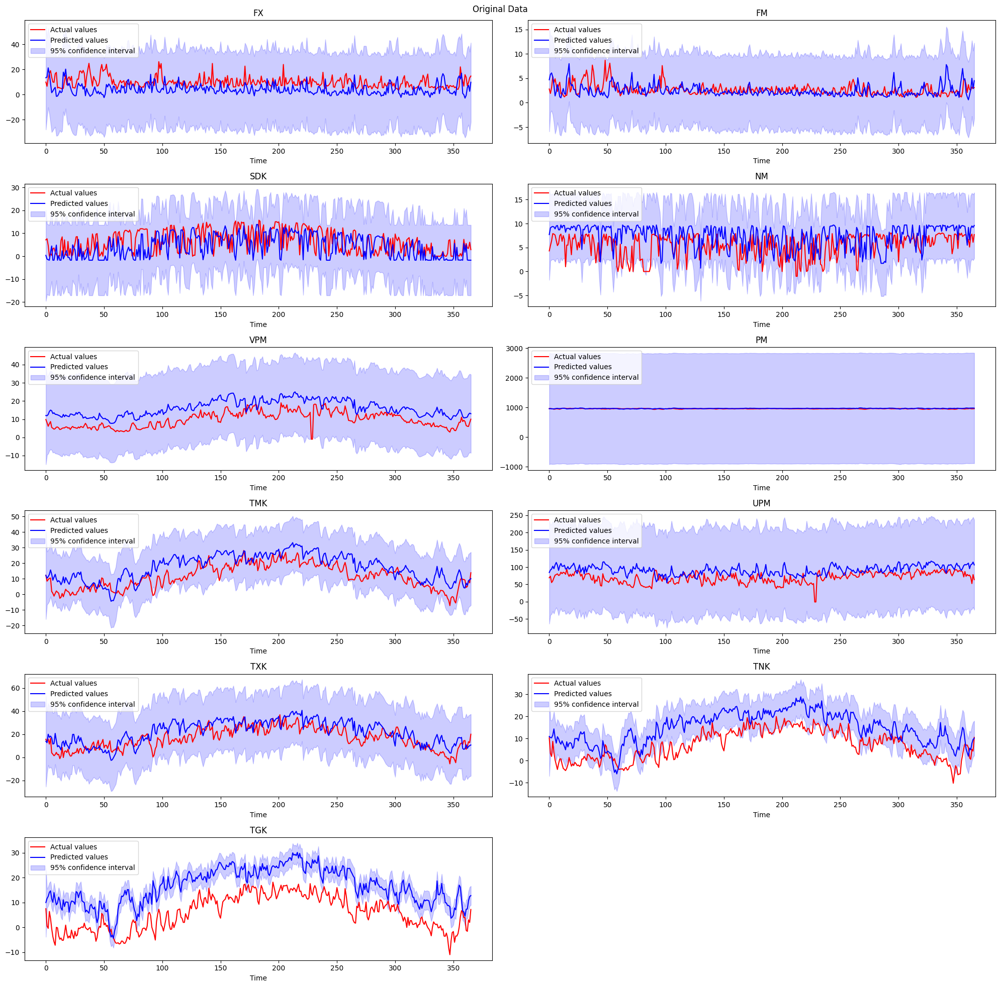

In [64]:
plt.figure(figsize=(20, 20))
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(X_test, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, pred_Gau.iloc[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), pred_Gau.iloc[:, i] - 1.96 * sigma_unscale[:, i], pred_Gau.iloc[:, i] + 1.96 * sigma_unscale[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{scaled_test.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## VAR

In [65]:
statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
FX,-6.830838,0.00000
FM,-8.127475,0.00000
SDK,-3.784396,0.00307
NM,-7.663985,0.00000
VPM,-2.536297,0.10689
PM,-12.241508,0.00000
TMK,-2.629805,0.08699
UPM,-3.422825,0.01020
TXK,-2.883903,0.04725
TNK,-2.502936,0.11476


### Find the optimize hyperparameters

In [66]:
def optimize_VAR(endog: Union[pd.Series, list]) -> pd.DataFrame:
    
    results = [[1, -22476.182547798704], [2, -22771.51352915151], [3, -22816.94297692379], [4, -22736.20873475218], [5, -22660.602362953374], [6, -22561.73761599999], [7, -22500.05282380872], [8, -22380.165835240245], [9, -22260.014225036557], [10, -22189.29426296569], [11, -22094.77402245826], [12, -22007.252735960556], [13, -21891.160148328156]]
    
    for i in tqdm_notebook(range(14,15)):
        try:
            model = VARMAX(endog, order=(i, 0)).fit(dips=False)
        except:
            continue
            
        aic = model.aic
        results.append([i, aic])
        print(results)
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['p', 'AIC']
    
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [67]:
result_df = optimize_VAR(diff_data)
result_df

  0%|          | 0/1 [00:00<?, ?it/s]

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1771     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.46132D+00    |proj g|=  2.32918D+00


 This problem is unconstrained.



At iterate    5    f= -8.48091D+00    |proj g|=  1.98371D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 1771      5      9      1     0     0   1.984D+00  -8.481D+00
  F =  -8.4809109690486526     

STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT        
[[1, -22476.182547798704], [2, -22771.51352915151], [3, -22816.94297692379], [4, -22736.20873475218], [5, -22660.602362953374], [6, -22561.73761599999], [7, -22500.05282380872], [8, -22380.165835240245], [9, -22260.014225036557], [10, -22189.29426296569], [11, -22094.77402245826], [12, -22007.252735960556], [13, -21891.160148328156], [14, -21205.29820768397]]

,p,AIC
0,3,-22816.942977
1,2,-22771.513529
2,4,-22736.208735
3,5,-22660.602363
4,6,-22561.737616
5,7,-22500.052824
6,1,-22476.182548
7,8,-22380.165835
8,9,-22260.014225
9,10,-22189.294263


### Performing tests

In [68]:
def granger_causality_matrix(data, max_lag):
    variables = data.columns
    df = pd.DataFrame(index=variables, columns=variables)
    for var1 in variables:
        for var2 in variables:
            test_result = grangercausalitytests(data[[var1, var2]], max_lag, verbose=False)
            p_values = [round(test[0]['ssr_ftest'][1], 4) for test in test_result.values()]
            min_p_value = np.min(p_values)
            df.loc[var1, var2] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [ ]:
result = granger_causality_matrix(diff_data, 3)
result

,FX_x,FM_x,SDK_x,NM_x,VPM_x,PM_x,TMK_x,UPM_x,TXK_x,TNK_x,TGK_x
FX_y,1.0,0.0007,0.3722,0.4081,0.0,0.0,0.0,0.0013,0.0,0.0,0.0
FM_y,0.0,1.0,0.1545,0.0842,0.0,0.0,0.0,0.1715,0.0,0.0,0.0
SDK_y,0.0001,0.2987,1.0,0.0,0.0,0.0,0.0,0.0006,0.0,0.0,0.0
NM_y,0.0878,0.1194,0.0741,1.0,0.0006,0.0,0.0017,0.0413,0.0003,0.0118,0.0017
VPM_y,0.0,0.0,0.0,0.0001,1.0,0.0284,0.0,0.0,0.0,0.0,0.0
PM_y,0.0,0.0,0.0,0.0001,0.1793,1.0,0.0001,0.0,0.0,0.0091,0.1452
TMK_y,0.0,0.0,0.0001,0.0018,0.0147,0.0,1.0,0.0883,0.0093,0.0002,0.0
UPM_y,0.0003,0.0261,0.0002,0.0,0.0,0.0,0.0,1.0,0.0018,0.0,0.0
TXK_y,0.0,0.0,0.0001,0.0001,0.004,0.0,0.0,0.0049,1.0,0.0,0.0006
TNK_y,0.0,0.0,0.0,0.0001,0.0,0.0,0.0,0.0,0.0,1.0,0.0001


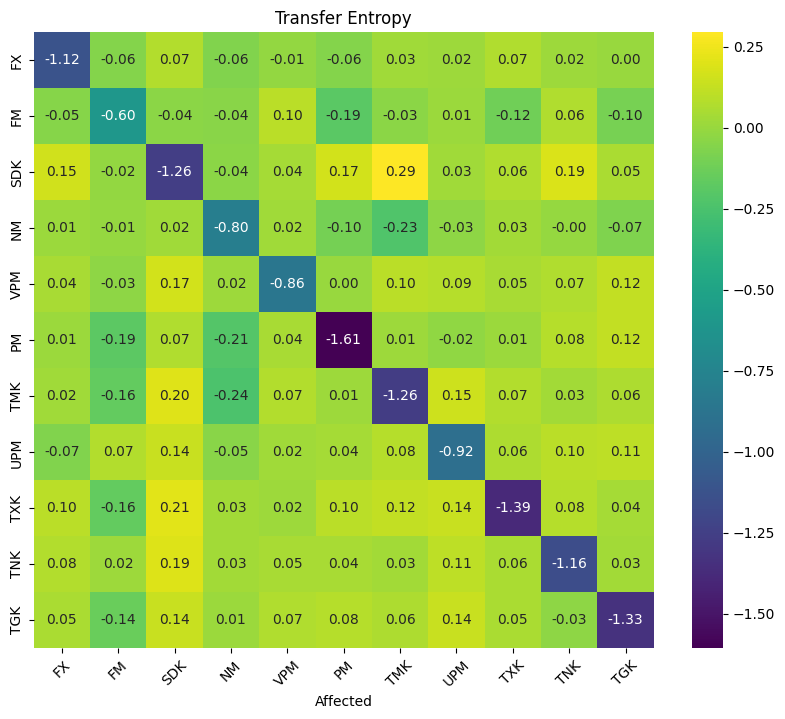

In [ ]:
transfer_entropy_matrix = np.zeros((11, 11))

for i in range(11):
    for j in range(11):
        transfer = transent(scaled_train.iloc[:, i], scaled_train.iloc[:, j], lag=3)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{scaled_train.columns[i]}' for i in range(11)], 
                                   index=[f'{scaled_train.columns[j]}' for j in range(11)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

In [ ]:
VAR_train = scaled_train.drop(columns=['FM', 'NM', 'SDK', 'TXK'])
VAR_test = scaled_test.drop(columns=['FM', 'NM', 'SDK', 'TXK'])

In [ ]:
result = granger_causality_matrix(VAR_train, 3)
result

,FX_x,VPM_x,PM_x,TMK_x,UPM_x,TNK_x,TGK_x
FX_y,1.0,0.0,0.0,0.0,0.0,0.0,0.0
VPM_y,0.0,1.0,0.0049,0.0,0.0,0.0,0.0
PM_y,0.0,0.0076,1.0,0.0006,0.0001,0.0033,0.0198
TMK_y,0.0,0.0001,0.0,1.0,0.0357,0.0008,0.0
UPM_y,0.0072,0.0,0.0,0.0003,1.0,0.0,0.0
TNK_y,0.0,0.0,0.0,0.0,0.0,1.0,0.0002
TGK_y,0.0,0.0,0.0,0.0,0.0,0.0,1.0


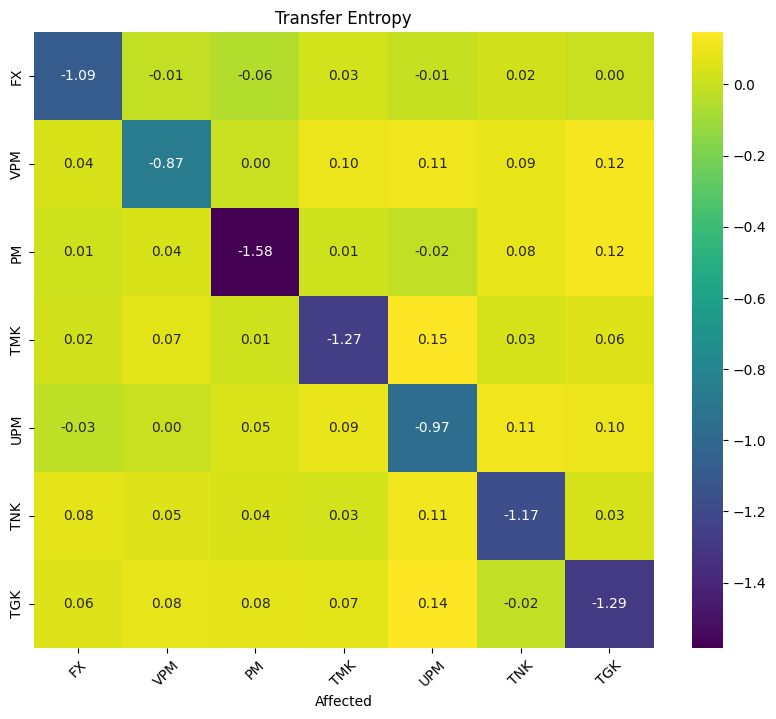

In [ ]:
transfer_entropy_matrix = np.zeros((7, 7))

for i in range(7):
    for j in range(7):
        transfer = transent(VAR_train.iloc[:, i], VAR_train.iloc[:, j], lag=3)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{VAR_train.columns[i]}' for i in range(7)], 
                                   index=[f'{VAR_train.columns[j]}' for j in range(7)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

### Model training

In [ ]:
start = time.time()
best_model = VARMAX(VAR_train, order=(3,0))
best_model_fit = best_model.fit(disp=False)
end = time.time()
print(best_model_fit.summary())

                                          Statespace Model Results                                         
Dep. Variable:     ['FX', 'VPM', 'PM', 'TMK', 'UPM', 'TNK', 'TGK']   No. Observations:                 1460
Model:                                                      VAR(3)   Log Likelihood                8648.386
                                                       + intercept   AIC                         -16932.772
Date:                                             Thu, 14 Nov 2024   BIC                         -15970.685
Time:                                                     15:04:23   HQIC                        -16573.875
Sample:                                                          0                                         
                                                            - 1460                                         
Covariance Type:                                               opg                                         
Ljung-Box (L1) (Q):     0.01

In [ ]:
print(end-start)

206.35968446731567


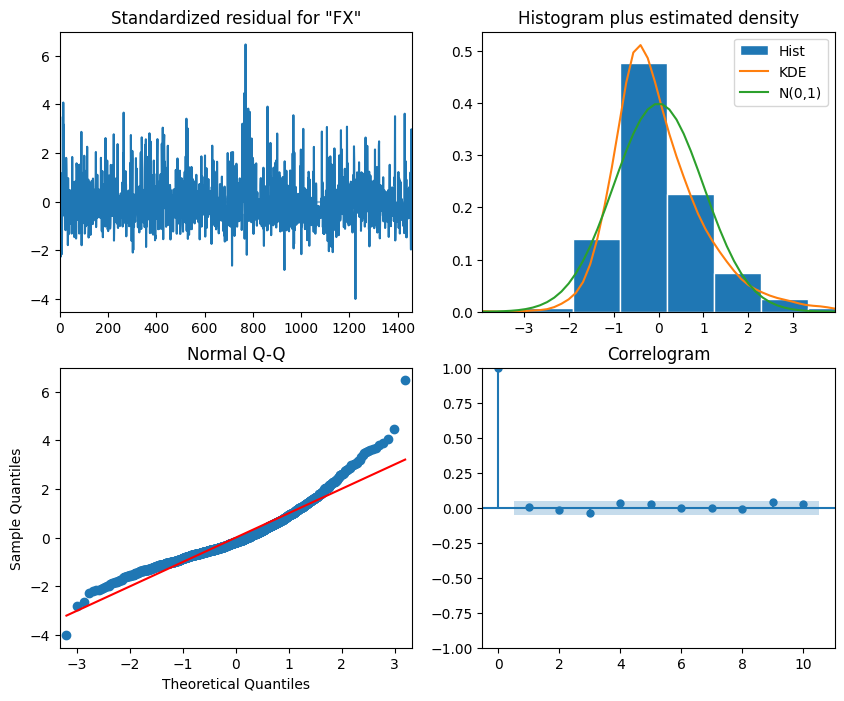

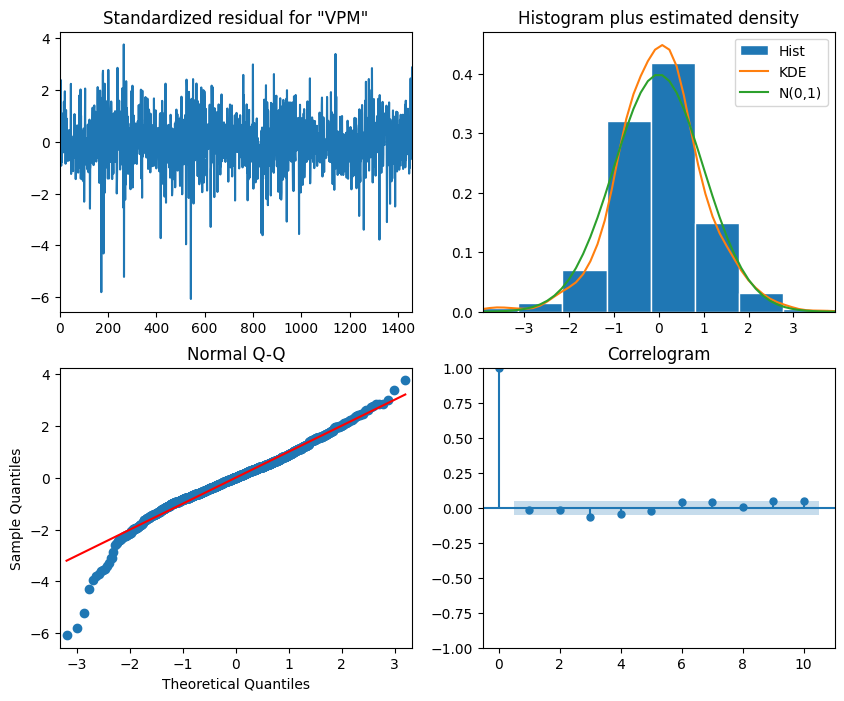

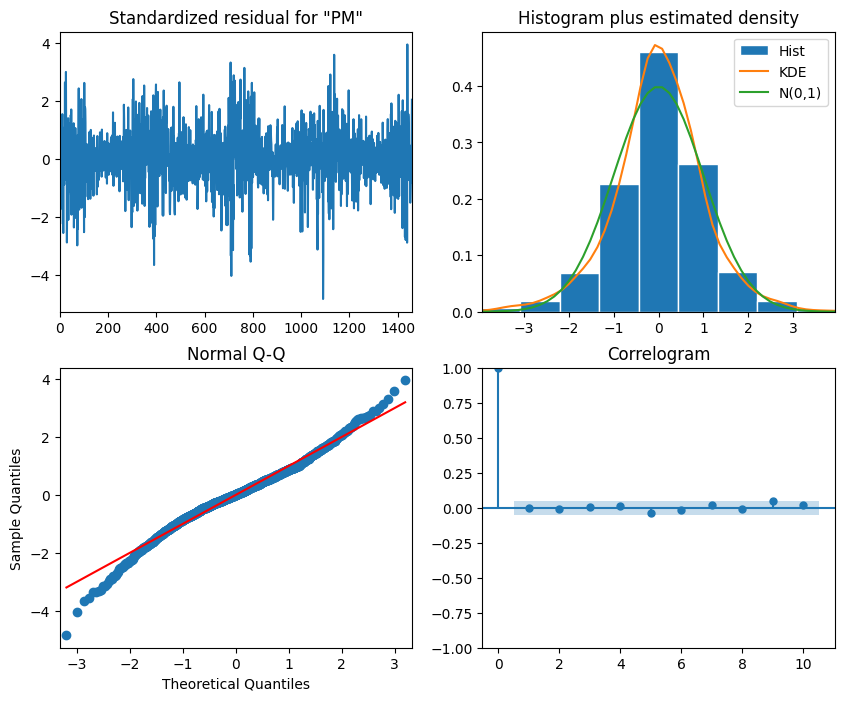

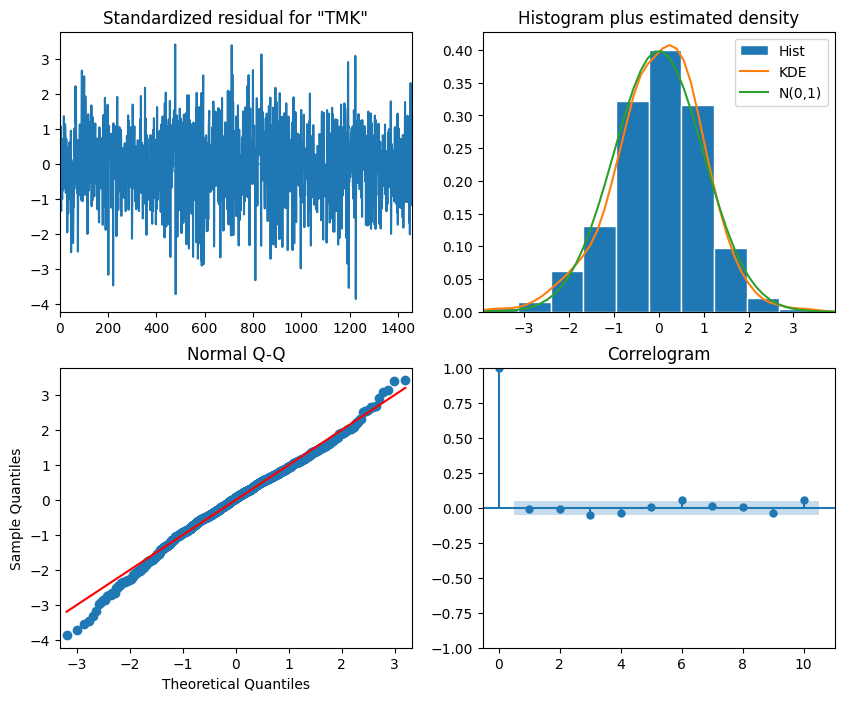

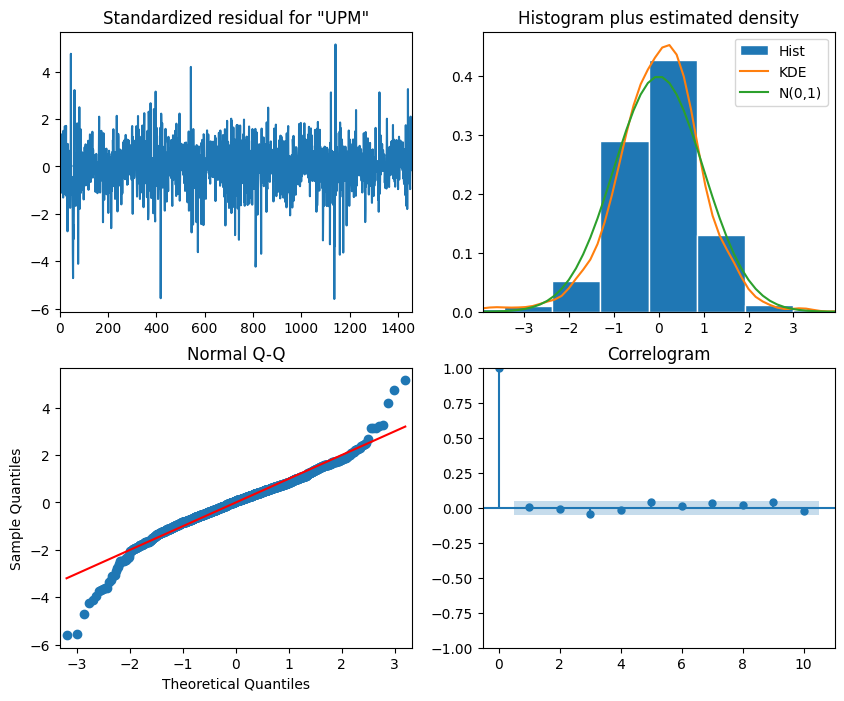

In [ ]:
for i in range(6):
    best_model_fit.plot_diagnostics(figsize=(10, 8), variable=i)

plt.show()

In [ ]:
TRAIN_LEN = len(VAR_train)
HORIZON = len(VAR_test)
WINDOW = HORIZON

In [ ]:
def rolling_forecast(df: pd.DataFrame, train_len: int, horizon: int, window: int) -> pd.DataFrame:
    
    total_len = train_len + horizon
    end_idx = train_len
    
    predictions_dict = {col: [] for col in df.columns}

    for i in range(train_len, total_len, window):
        #model = VARMAX(df[:i], order=(10,0))
        #res = model.fit(disp=False)
        predictions = best_model_fit.get_prediction(0, i + window - 1)

        for col in df.columns:
            oos_pred = predictions.predicted_mean.iloc[-window:][col]
            predictions_dict[col].extend(oos_pred)

    predictions_df = pd.DataFrame(predictions_dict)
    return predictions_df


In [ ]:
pred_VAR = rolling_forecast(VAR_train, TRAIN_LEN, HORIZON, WINDOW)
pred_VAR.head()

,FX,VPM,PM,TMK,UPM,TNK,TGK
0,-0.224417,0.086614,0.331770,0.198043,0.484054,0.317681,0.363223
1,-0.306213,-0.014083,0.274058,0.159579,0.375075,0.248591,0.295081
2,-0.364823,-0.053911,0.234387,0.147723,0.306944,0.210768,0.258356
3,-0.387178,-0.069557,0.226475,0.148073,0.253266,0.193773,0.236978
4,-0.399490,-0.079063,0.221884,0.148357,0.216773,0.186286,0.225540


### Model Evaluation
#### Scaled data


In [ ]:
cols = pred_VAR.columns

for col in cols:
    print(f'MSE for {col}: {mean_squared_error(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'MSE total: {mean_squared_error(VAR_test, pred_VAR)}')

MSE for FX: 0.06282975188876665
MSE for VPM: 0.20820510520075322
MSE for PM: 0.0639115158603558
MSE for TMK: 0.16502674138564488
MSE for UPM: 0.23215109701753595
MSE for TNK: 0.15014726148353513
MSE for TGK: 0.16299951851958222
MSE total: 0.1493244273365963


In [ ]:
for col in cols:
    print(f'RMSE for {col}: {mean_squared_error(VAR_test.loc[:, col], pred_VAR.loc[:, col], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(VAR_test, pred_VAR, squared=False)}')

RMSE for FX: 0.25065863617431305
RMSE for VPM: 0.4562949760853753
RMSE for PM: 0.2528072701888848
RMSE for TMK: 0.40623483526852405
RMSE for UPM: 0.48182060667590376
RMSE for TNK: 0.3874884017406652
RMSE for TGK: 0.4037319884769873
RMSE total: 0.37700524494437904


In [ ]:
for col in cols:
    print(f'MAE for {col}: {mean_absolute_error(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'MAE total: {mean_absolute_error(VAR_test, pred_VAR)}')

MAE for FX: 0.1897642579124121
MAE for VPM: 0.39272991372262844
MAE for PM: 0.19615922097971092
MAE for TMK: 0.3437512443564203
MAE for UPM: 0.387845958286776
MAE for TNK: 0.3371080072262845
MAE for TGK: 0.35199245230502446
MAE total: 0.3141930078270367


In [ ]:
for col in cols:
    print(f'R2 for {col}: {r2_score(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'R2 total: {r2_score(VAR_test, pred_VAR)}')

R2 for FX: -0.007909346097904502
R2 for VPM: -0.03434786734404405
R2 for PM: -0.04787915186514358
R2 for TMK: -0.04116674201837611
R2 for UPM: -0.02626282518031342
R2 for TNK: -0.03725794707184571
R2 for TGK: -0.04481605689976176
R2 total: -0.03423427663962702


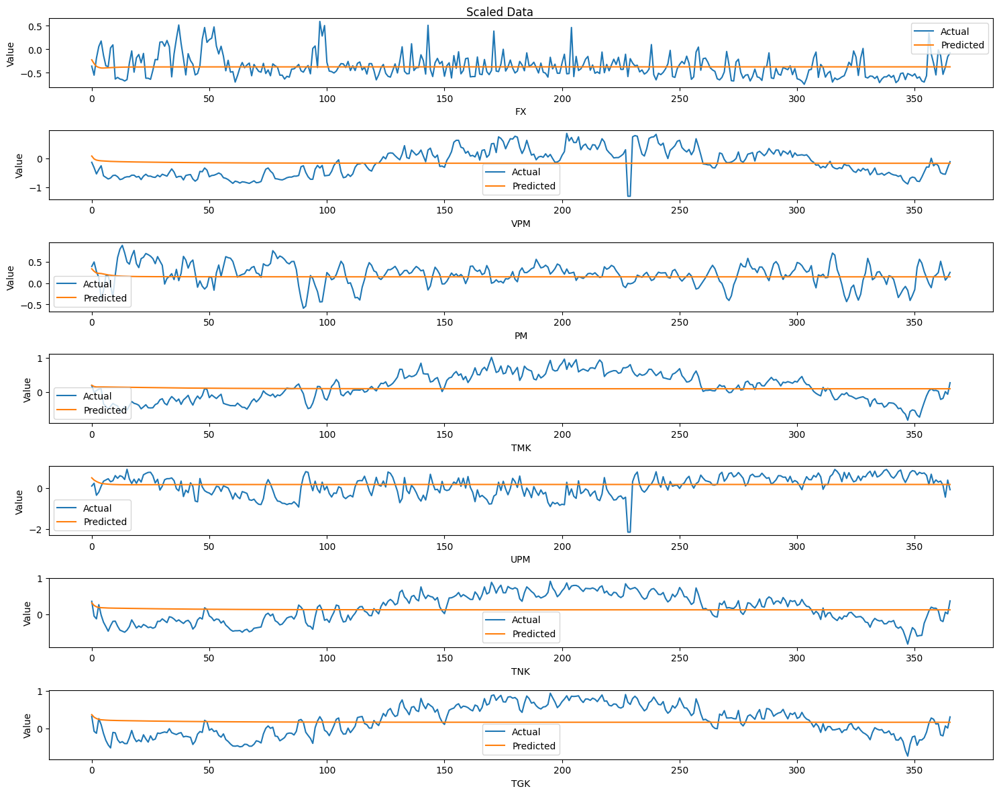

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(cols):
    plt.subplot(9, 1, i+1)
    plt.plot(VAR_test.loc[:, col], label='Actual')
    plt.plot(pred_VAR.loc[:, col], label='Predicted')
    plt.title('')
    plt.xlabel(f'{col}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data


In [ ]:
def inverse(dataset, cols):
    temp = dataset.copy()
    for col in cols:
        scaler = scalers['scaler_' + col]
        temp.loc[:, col] = scaler.inverse_transform(np.reshape(dataset.loc[:, col], (-1, 1))).flatten()
    return temp

In [ ]:
inverse_VAR = inverse(pred_VAR, cols)
inverse_VAR.head()

,FX,VPM,PM,TMK,UPM,TNK,TGK
0,12.184919,11.796846,960.588863,12.482625,81.747704,9.527645,8.251913
1,10.794378,10.870436,958.946944,11.747963,78.314850,8.325485,7.069652
2,9.798010,10.504016,957.818307,11.521516,76.168746,7.667356,6.432474
3,9.417968,10.360078,957.593218,11.528188,74.477882,7.371657,6.061566
4,9.208662,10.272618,957.462597,11.533617,73.328361,7.241381,5.863126


In [ ]:
VAR_test_df = test_df.drop(columns=['FM', 'NM', 'SDK', 'TXK'])

for col in cols:
    print(f'MSE for {col}: {mean_squared_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col])}')
    
print(f'MSE total: {mean_squared_error(VAR_test_df, inverse_VAR)}')

MSE for FX: 18.157798295853564
MSE for VPM: 17.622480104191744
MSE for PM: 51.73014071616165
MSE for TMK: 60.20340552489713
MSE for UPM: 230.35192601565004
MSE for TNK: 45.458584886755084
MSE for TGK: 49.06652256356094
MSE total: 67.51297972958146


In [ ]:
for col in cols:
    print(f'RMSE for {col}: {mean_squared_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(VAR_test_df, inverse_VAR, squared=False)}')

RMSE for FX: 4.261196814963323
RMSE for VPM: 4.197913779985452
RMSE for PM: 7.192366836873774
RMSE for TMK: 7.7590853536288105
RMSE for UPM: 15.177349110290969
RMSE for TNK: 6.742298190287573
RMSE for TGK: 7.00475000007573
RMSE total: 7.476422869443661


In [ ]:
for col in cols:
    print(f'MAE for {col}: {mean_absolute_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col])}')
    
print(f'MAE total: {mean_absolute_error(VAR_test_df, inverse_VAR)}')

MAE for FX: 3.225992384511006
MAE for VPM: 3.6131152062481813
MAE for PM: 5.580729836872778
MAE for TMK: 6.565648767207629
MAE for UPM: 12.21714768603344
MAE for TNK: 5.865679325737349
MAE for TGK: 6.107069047492175
MAE total: 6.16791175058608


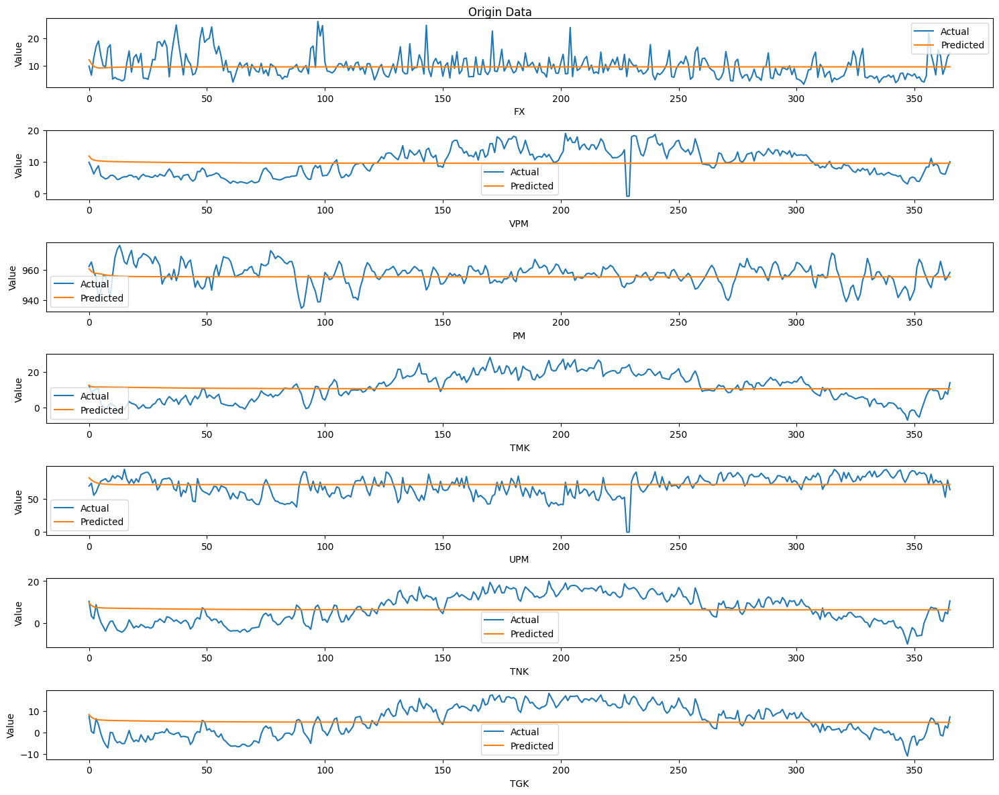

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(cols):
    plt.subplot(9, 1, i+1)
    plt.plot(VAR_test_df.iloc[:, i], label='Actual')
    plt.plot(inverse_VAR.iloc[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{col}')
    plt.ylabel('Value')
    plt.legend()

plt.suptitle('Origin Data')
plt.tight_layout()
plt.show()

# CNN
### Find optimal parameters

In [ ]:
print('Starting find optimal parameters for CNN model')
# Hàm xây dựng mô hình CNN
def build_cnn_model(filters, kernel_size, n_past, n_features):
    inputs = tf.keras.layers.Input(shape=(n_past, n_features))
    
    conv = tf.keras.layers.Conv1D(filters=filters, kernel_size=kernel_size,
                                  activation='relu', padding='same')(inputs)
    gap = tf.keras.layers.GlobalAveragePooling1D()(conv)
    outputs = tf.keras.layers.Dense(n_features)(gap)
    
    model_CNN = tf.keras.models.Model(inputs, outputs)
    model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model_CNN

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'filters': [16, 32, 64],
    'kernel_size': [3, 5, 7]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_cnn_model(params['filters'], params['kernel_size'], n_past, n_features)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0,
        validation_split=0.2
    )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_CNN = results[0]

Starting find optimal parameters for CNN model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3}


I0000 00:00:1732704441.763606      99 service.cc:145] XLA service 0x793a50005cd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732704441.763660      99 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1732704443.073639      99 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 3}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 3}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 32, 'kernel_size': 3}
Testing with parameters: {'batch_size': 32, 'filters': 32, 'kernel_size': 5}

### Model initialization

In [ ]:
with strategy.scope():
    inputs = tf.keras.layers.Input(shape=(n_past, n_features))

    conv = tf.keras.layers.Conv1D(filters=best_para_CNN['filters'], kernel_size=best_para_CNN['kernel_size'], activation='relu', padding='same')(inputs) # [batch_size, time_steps, filters]
    
    # Giảm kích thước dữ liệu từ 3D xuống 2D bằng cách lấy trung bình của tất cả các bước thời gian trên mỗi bộ lọc.
    gap = tf.keras.layers.GlobalAveragePooling1D()(conv) # [batch_size, filters]
    outputs = tf.keras.layers.Dense(n_features)(gap)

    model_CNN = tf.keras.models.Model(inputs, outputs)

model_CNN.summary()

Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)     │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_27 (Conv1D)              │ (None, 3, 64)          │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_27     │ (None, 64)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 7)              │           455 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,655 (14.28 KB)

 Trainable params: 3,655 (14.28 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
print('Start training CNN')
reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

start = time.time()
with strategy.scope():
    model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])

    # Train the model
    history_CNN = model_CNN.fit(
        trainX, 
        trainY, 
        validation_split=0.2,
        epochs=100, 
        batch_size=best_para_CNN['batch_size'],
        verbose=0,
        callbacks=[reduce_lr, early_stop]
    )
end = time.time()
print('Complete tranning model')

Start training CNN
Complete tranning model


In [ ]:
pred_CNN = model_CNN.predict(testX)
print(end-start)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
33.692036151885986


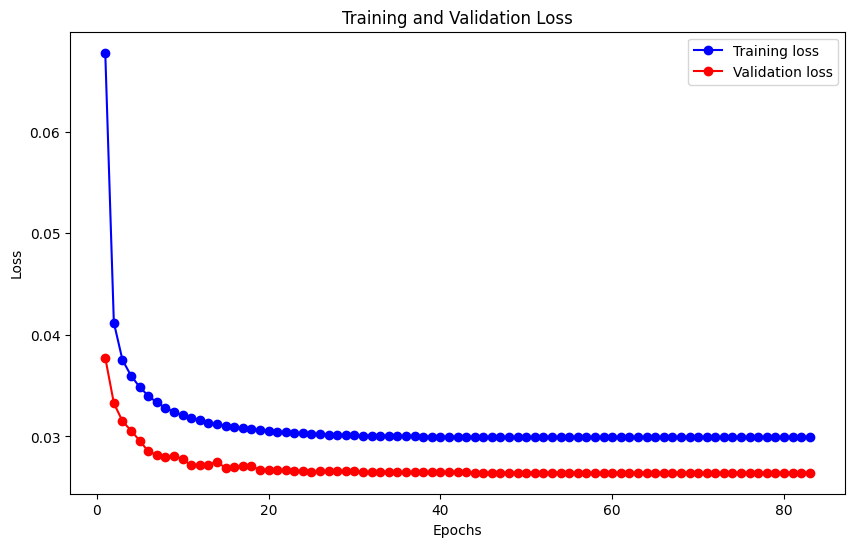

In [ ]:
loss = history_CNN.history['loss']
val_loss = history_CNN.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_CNN)}')

MSE for FX: 0.10580843249744444
MSE for VPM: 0.041912906513509256
MSE for PM: 0.045280739104671903
MSE for TMK: 0.01776623912763972
MSE for UPM: 0.0584548300228884
MSE for TNK: 0.01742228641873964
MSE for TGK: 0.024336787593502242
MSE total: 0.04442603161119939


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_CNN, squared=False)}')

RMSE for FX: 0.3252820814269431
RMSE for VPM: 0.20472641869946648
RMSE for PM: 0.21279271393699528
RMSE for TMK: 0.13329005637195793
RMSE for UPM: 0.24177433698159198
RMSE for TNK: 0.13199350900229767
RMSE for TGK: 0.15600252431772457
RMSE total: 0.2008373772481396


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_CNN)}')

MAE for FX: 0.24780938745576275
MAE for VPM: 0.14513207413522994
MAE for PM: 0.1607239697490021
MAE for TMK: 0.10598778545905645
MAE for UPM: 0.18398249144693288
MAE for TNK: 0.10332844127379567
MAE for TGK: 0.12475945084437697
MAE total: 0.1531033714805938


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_CNN[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_CNN)}')

R2 for FX: 0.24075092204189408
R2 for VPM: 0.755410635775251
R2 for PM: 0.6015731853146206
R2 for TMK: 0.9044729697017617
R2 for UPM: 0.4064045252231808
R2 for TNK: 0.9104175340500488
R2 for TGK: 0.8900226159154251
R2 total: 0.6727217697174543


#### Unscaled data

In [ ]:
unscaled_CNN = unscale(pred_CNN)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_CNN)}')

MSE for FX: 22.554125454505773
MSE for VPM: 8.93415498294624
MSE for PM: 9.65204231045742
MSE for TMK: 3.7870515139204737
MSE for UPM: 12.460231248588608
MSE for TNK: 3.713734484007324
MSE for TGK: 5.187629480140804
MSE total: 9.469852782080947


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_CNN, squared=False)}')

RMSE for FX: 4.7491183870804665
RMSE for VPM: 2.9890056846627506
RMSE for PM: 3.1067736175102008
RMSE for TMK: 1.9460348182703395
RMSE for UPM: 3.5299052747331063
RMSE for TNK: 1.9271052083390061
RMSE for TGK: 2.277636819192385
RMSE total: 2.9322256871126067


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_CNN)}')

MAE for FX: 3.618017067638493
MAE for VPM: 2.118928252674661
MAE for PM: 2.346569951298429
MAE for TMK: 1.547421659886811
MAE for UPM: 2.68614434417555
MAE for TNK: 1.5085952150823507
MAE for TGK: 1.8214879506308659
MAE total: 2.235309205912452


### Plot predict data

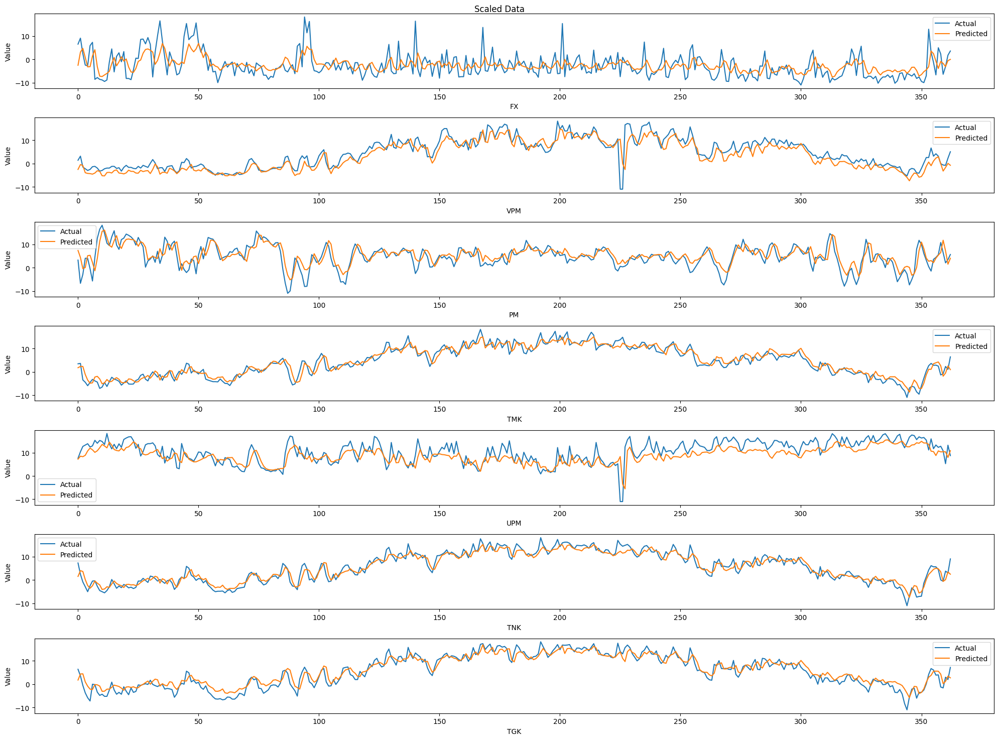

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# LSTM
### Find optimal parameters

In [ ]:
print('Starting find optimal parameters for LSTM model')
def build_lstm_model(n_units, n_past, n_features):
    inputs = tf.keras.layers.Input(shape=(n_past, n_features))
    lstm = tf.keras.layers.LSTM(n_units, return_state=True)
    _, state_h, _ = lstm(inputs)
    outputs = tf.keras.layers.Dense(n_features)(state_h)
    
    model_LSTM = tf.keras.models.Model(inputs, outputs)
    model_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return model_LSTM

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'units': [32, 64, 128]
}

# Lưu tham số và kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_lstm_model(params['units'], n_past, n_features)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0
    )
    
    # Lưu lại kết quả
    loss = history.history['loss'][-1]
    mae = history.history['mae'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'units': params['units'],
        'loss': loss,
        'mae': mae
    })

# Sắp xếp kết quả theo loss
results = sorted(results, key=lambda x: x['loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_LSTM = results[0]

Starting find optimal parameters for LSTM model
Testing with parameters: {'batch_size': 16, 'units': 32}
Testing with parameters: {'batch_size': 16, 'units': 64}
Testing with parameters: {'batch_size': 16, 'units': 128}
Testing with parameters: {'batch_size': 32, 'units': 32}
Testing with parameters: {'batch_size': 32, 'units': 64}
Testing with parameters: {'batch_size': 32, 'units': 128}
Testing with parameters: {'batch_size': 64, 'units': 32}
Testing with parameters: {'batch_size': 64, 'units': 64}
Testing with parameters: {'batch_size': 64, 'units': 128}
Best parameters: {'batch_size': 16, 'units': 128, 'loss': 0.032685719430446625, 'mae': 0.13290633261203766}


### Model initialization

In [ ]:
with strategy.scope():
    inputs = tf.keras.layers.Input(shape=(n_past, n_features))
    
    lstm = tf.keras.layers.LSTM(best_para_LSTM['units'], return_state=True)
    _, state_h, state_c = lstm(inputs)
    
    outputs = tf.keras.layers.Dense(n_features)(state_h)

    model_LSTM = tf.keras.models.Model(inputs, outputs)

model_LSTM.summary()

Model: "functional_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)     │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ [(None, 128), (None,   │        69,632 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 70,535 (275.53 KB)

 Trainable params: 70,535 (275.53 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
print('Start training LSTM')
reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
start = time.time()
# Sử dụng Adam optimizer và Huber loss function để biên dịch model
with strategy.scope():
    model_LSTM.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.Huber())
    history_LSTM = model_LSTM.fit(trainX, trainY,
                                epochs=50,
                                validation_split=0.2,
                                batch_size=best_para_LSTM['batch_size'],
                                verbose=0,
                                callbacks=[reduce_lr, early_stopping])
    
end = time.time()
print('Complete tranning model')

Start training LSTM
Complete tranning model


In [ ]:
pred_LSTM = model_LSTM.predict(testX)
print(end-start)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
20.007034301757812


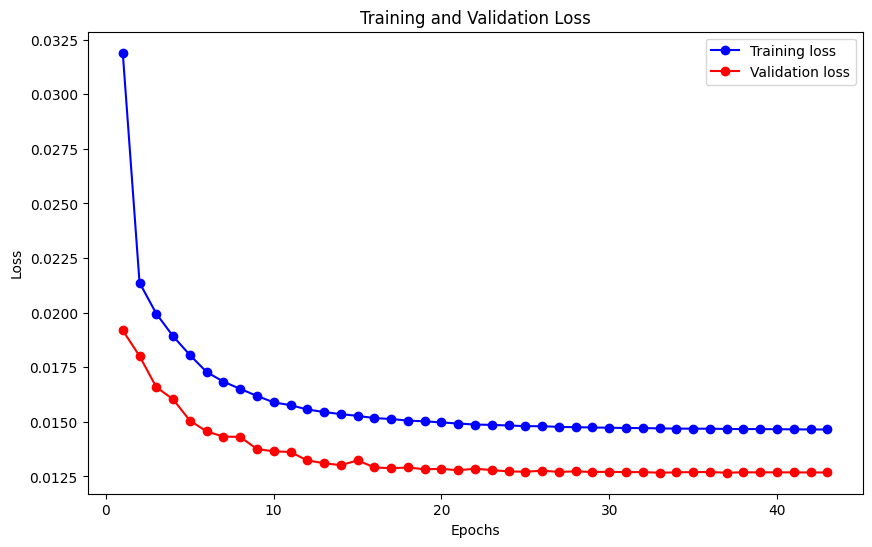

In [ ]:
loss = history_LSTM.history['loss']
val_loss = history_LSTM.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_LSTM)}')

MSE for FX: 0.10640352358003573
MSE for VPM: 0.03981128875392851
MSE for PM: 0.03739617292348979
MSE for TMK: 0.018496505267425987
MSE for UPM: 0.048503074688673715
MSE for TNK: 0.01722221349441911
MSE for TGK: 0.022411111527259647
MSE total: 0.04146341289074749


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_LSTM, squared=False)}')

RMSE for FX: 0.32619552967512555
RMSE for VPM: 0.19952766413189052
RMSE for PM: 0.19338090113423764
RMSE for TMK: 0.13600185758814468
RMSE for UPM: 0.2202341360658554
RMSE for TNK: 0.1312334313138962
RMSE for TGK: 0.14970341187581412
RMSE total: 0.19375384739785195


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_LSTM)}')

MAE for FX: 0.24848984629105733
MAE for VPM: 0.1427706837859364
MAE for PM: 0.14527877421397584
MAE for TMK: 0.1082380744159113
MAE for UPM: 0.16434888585221133
MAE for TNK: 0.1002675175681163
MAE for TGK: 0.12065957461110287
MAE total: 0.14715047953404445


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_LSTM[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_LSTM)}')

R2 for FX: 0.2364807297226813
R2 for VPM: 0.7676749570647711
R2 for PM: 0.6709497602305617
R2 for TMK: 0.9005464124174678
R2 for UPM: 0.5074623322540601
R2 for TNK: 0.9114462753701991
R2 for TGK: 0.8987247018232701
R2 total: 0.6990407384118588


#### Unscaled data

In [ ]:
unscaled_LSTM = unscale(pred_LSTM)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_LSTM)}')

MSE for FX: 22.68097509805757
MSE for VPM: 8.486174099974745
MSE for PM: 7.971368226018896
MSE for TMK: 3.9427150447769352
MSE for UPM: 10.338914995884213
MSE for TNK: 3.671087005892318
MSE for TGK: 4.777152449092615
MSE total: 8.838340988528184


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_LSTM, squared=False)}')

RMSE for FX: 4.762454734489092
RMSE for VPM: 2.91310386014209
RMSE for PM: 2.8233611575600626
RMSE for TMK: 1.9856271162473924
RMSE for UPM: 3.2154183236220155
RMSE for TNK: 1.9160080912909314
RMSE for TGK: 2.185669794157529
RMSE total: 2.828806153929873


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_LSTM)}')

MAE for FX: 3.6279517737631575
MAE for VPM: 2.084451951741322
MAE for PM: 2.121070107717308
MAE for TMK: 1.5802758757092432
MAE for UPM: 2.399493661231177
MAE for TNK: 1.463905738126918
MAE for TGK: 1.7616297712421283
MAE total: 2.14839698279018


### Plot predict data

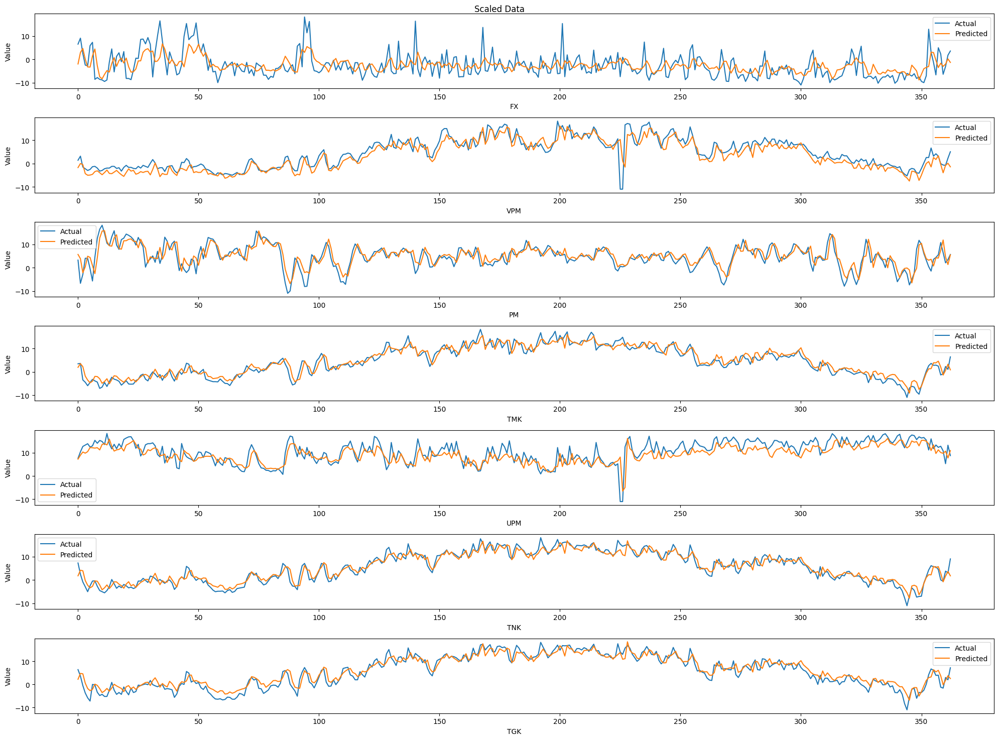

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# CNN + LSTM
### Find optimal parameters

In [ ]:
print('Starting find optimal parameters for CNN + LSTM model')
def build_cnn_lstm_model(filters, kernel_size, lstm_units, n_past, n_features):
    inputs = tf.keras.layers.Input(shape=(n_past, n_features))
    
    # Lớp Conv1D
    conv = tf.keras.layers.Conv1D(filters=filters, kernel_size=kernel_size, 
                                  activation='relu', padding='same')(inputs)
    # Lớp LSTM
    lstm = tf.keras.layers.LSTM(lstm_units, return_state=True)
    _, state_h, _ = lstm(conv)
    
    # Lớp đầu ra
    outputs = tf.keras.layers.Dense(n_features)(state_h)
    
    model_cnn_lstm = tf.keras.models.Model(inputs, outputs)
    model_cnn_lstm.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model_cnn_lstm

# Tập giá trị tham số cần quét
param_grid = {
    'filters': [16, 32, 64],
    'kernel_size': [3, 5],
    'lstm_units': [32, 64, 128],
    'batch_size': [16, 32, 64]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_cnn_lstm_model(params['filters'], params['kernel_size'], 
                                 params['lstm_units'], n_past, n_features)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,  # Số epochs thấp để giảm thời gian chạy (có thể tăng khi cần)
        verbose=0,
        validation_split=0.2
    )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'lstm_units': params['lstm_units'],
        'batch_size': params['batch_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_cnn_lstm = results[0]

Starting find optimal parameters for CNN + LSTM model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5, 'lstm_units

### Model initialization

In [ ]:
with strategy.scope():
    inputs = tf.keras.layers.Input(shape = (n_past, n_features))
    
    conv = tf.keras.layers.Conv1D(filters = best_para_cnn_lstm['filters'], 
                                  kernel_size = best_para_cnn_lstm['kernel_size'],
                                  activation = 'relu', padding = 'same')(inputs)

    lstm = tf.keras.layers.LSTM(best_para_cnn_lstm['lstm_units'], return_state=True)
    _, state_h, state_c = lstm(conv)
    
    outputs = tf.keras.layers.Dense(n_features)(state_h)
    
    model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)

model_CNN_LSTM.summary()

Model: "functional_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_92 (InputLayer)     │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_82 (Conv1D)              │ (None, 3, 64)          │         2,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_64 (LSTM)                  │ [(None, 128), (None,   │        98,816 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 102,023 (398.53 KB)

 Trainable params: 102,023 (398.53 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
print('Start training CNN+LSTM')
reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
start = time.time()

with strategy.scope():
    model_CNN_LSTM.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.Huber())
    history_CNN_LSTM = model_CNN_LSTM.fit(trainX,trainY,
                                  epochs=100,
                                  validation_split=0.2,
                                  batch_size=best_para_cnn_lstm['batch_size'],
                                  verbose=0,
                                  callbacks=[reduce_lr, early_stopping])

end = time.time()
print('Complete tranning model')

Start training CNN+LSTM
Complete tranning model


In [ ]:
pred_CNN_LSTM = model_CNN_LSTM.predict(testX)
print(end-start)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
12.30565357208252


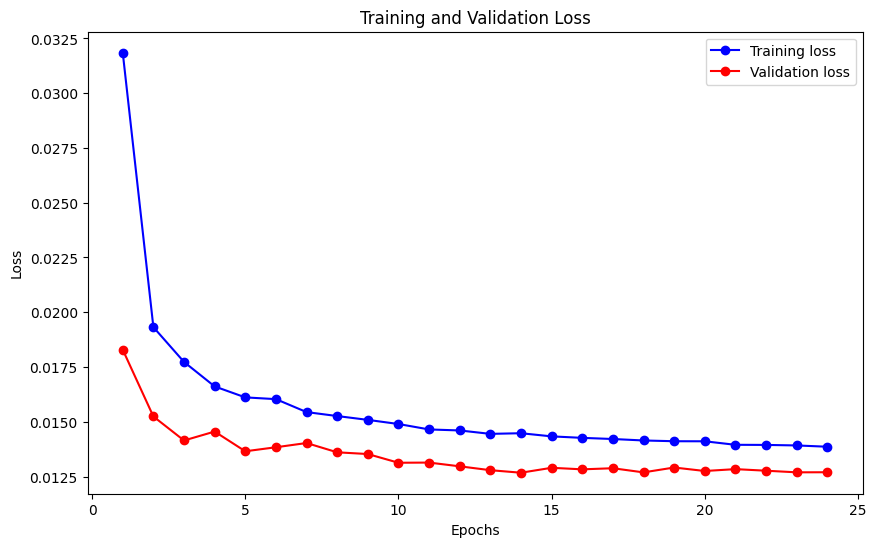

In [ ]:
loss = history_CNN_LSTM.history['loss']
val_loss = history_CNN_LSTM.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_CNN_LSTM)}')

MSE for FX: 0.10168026016533745
MSE for VPM: 0.0407667853693693
MSE for PM: 0.04338935816101098
MSE for TMK: 0.01908169937078315
MSE for UPM: 0.047483375967310795
MSE for TNK: 0.01932991508072102
MSE for TGK: 0.030797203605807795
MSE total: 0.04321837110290578


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_CNN_LSTM, squared=False)}')

RMSE for FX: 0.3188734234227391
RMSE for VPM: 0.20190786356496693
RMSE for PM: 0.20830112376319762
RMSE for TMK: 0.1381365243908473
RMSE for UPM: 0.21790680569296314
RMSE for TNK: 0.13903206493726913
RMSE for TGK: 0.17549132059964617
RMSE total: 0.19994987519594706


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_CNN_LSTM)}')

MAE for FX: 0.24264663052033317
MAE for VPM: 0.14906139804825147
MAE for PM: 0.1569717355544281
MAE for TMK: 0.1106618471396167
MAE for UPM: 0.16022421405528484
MAE for TNK: 0.11026400317905836
MAE for TGK: 0.14258368266171778
MAE total: 0.1532019301655272


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_CNN_LSTM)}')

R2 for FX: 0.2703734290843275
R2 for VPM: 0.7620990061434424
R2 for PM: 0.6182155127067921
R2 for TMK: 0.8973998908357121
R2 for UPM: 0.5178171403409151
R2 for TNK: 0.9006088283756152
R2 for TGK: 0.8608281443607173
R2 total: 0.6896202788353601


#### Unscaled data

In [ ]:
unscaled_CNN_LSTM = unscale(pred_CNN_LSTM)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, pred_CNN_LSTM)}')

MSE for FX: 33.60936753745313
MSE for VPM: 53.03256441486067
MSE for PM: 43.336285088209614
MSE for TMK: 53.026146876952964
MSE for UPM: 120.99765719666273
MSE for TNK: 65.54596348398974
MSE for TGK: 71.03887367161
MSE total: 62.940979752819814


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], pred_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, pred_CNN_LSTM, squared=False)}')

RMSE for FX: 5.797358669036541
RMSE for VPM: 7.282346079036664
RMSE for PM: 6.583030084103339
RMSE for TMK: 7.281905442736329
RMSE for UPM: 10.999893508423739
RMSE for TNK: 8.096046163652337
RMSE for TGK: 8.428456185542522
RMSE total: 7.781290876075923


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, pred_CNN_LSTM)}')

MAE for FX: 4.868064111935869
MAE for VPM: 5.770440636767871
MAE for PM: 5.625045965625665
MAE for TMK: 5.969454544857783
MAE for UPM: 10.198199909503101
MAE for TNK: 6.558740956220691
MAE for TGK: 6.8162289954398645
MAE total: 6.543739302907267


### Plot predict data

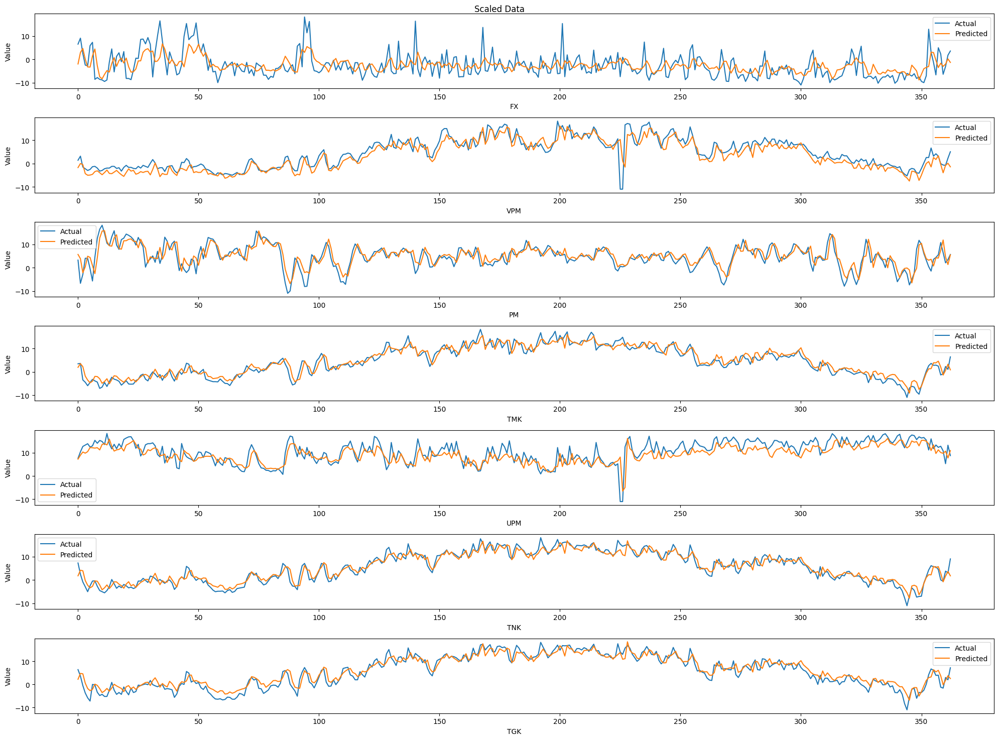

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

## VAR-NN
### Defining model

In [91]:
def to_sequences_multivariate(dataset, p):
    x = []
    y = []
    for i in range(p, len(dataset)):
        x.append(dataset.iloc[i - p:i, 0:dataset.shape[1]])
        y.append(dataset.iloc[i:i + 1, 0:dataset.shape[1]])
    x = np.array(x)
    y = np.array(y)
    return x,y.reshape(y.shape[0], y.shape[2])

In [ ]:
p = 3

trainX, trainY = to_sequences_multivariate(VAR_train, p)
testX, testY = to_sequences_multivariate(VAR_test, p)

In [93]:
class VARNN(tf.keras.Model):
    def __init__(self, ffnn_model, var_model):
        super(VARNN, self).__init__()
        self.ffnn_model = ffnn_model
        self.var_model = var_model

    def call(self, inputs):
        ffnn_output = self.ffnn_model(inputs)
        var_output = self.var_model(ffnn_output)
        return var_output

In [ ]:
num_outputs = 7
ffnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(p, 7)),
    tf.keras.layers.Dense(50, activation='sigmoid'),
])
var_model = tf.keras.layers.Dense(num_outputs)

In [95]:
VARNN_model = VARNN(ffnn_model, var_model)
start = time.time()
VARNN_model.compile(optimizer='adam', loss='mse')
history = VARNN_model.fit(trainX, trainY, verbose=0, epochs=100, batch_size=32, validation_split=0.2)
end = time.time()

In [ ]:
print(end-start)

10.99874472618103


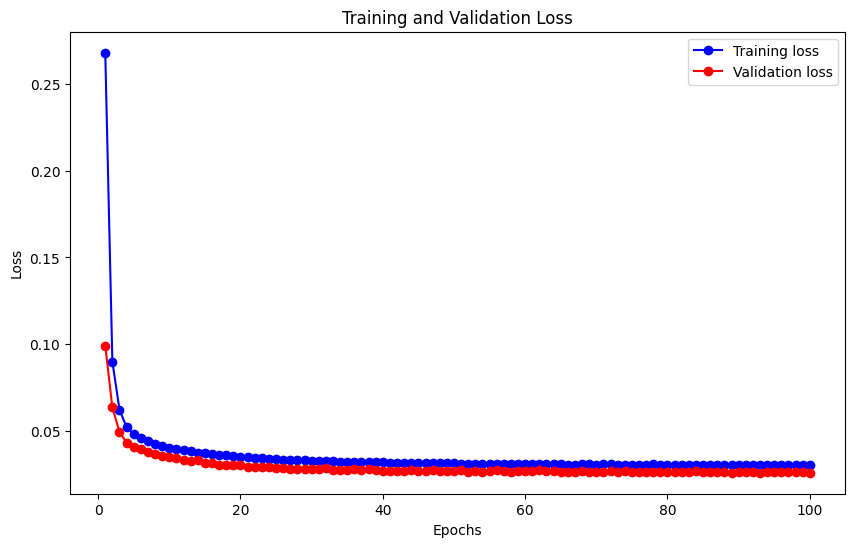

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
pred_VARNN = VARNN_model.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


### Model Evaluation
#### Scaled data

In [ ]:
for i in range(num_outputs):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_VARNN)}')

MSE for FX: 0.0486163049373575
MSE for FM: 0.032079493888327745
MSE for SDK: 0.01938932412654942
MSE for NM: 0.013810252975924267
MSE for VPM: 0.09397084881575692
MSE for PM: 0.011890407824432103
MSE for TMK: 0.01324818423266218
MSE total: 0.033286402400144306


In [ ]:
for i in range(num_outputs):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_VARNN, squared=False)}')

RMSE for FX: 0.2204910540982502
RMSE for FM: 0.1791074925521759
RMSE for SDK: 0.13924555334569724
RMSE for NM: 0.1175170327055796
RMSE for VPM: 0.30654665030914446
RMSE for PM: 0.10904314661835517
RMSE for TMK: 0.115100756872673
RMSE total: 0.16957881235741082


In [ ]:
for i in range(num_outputs):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_VARNN)}')

MAE for FX: 0.16716470261400357
MAE for FM: 0.11647832891600962
MAE for SDK: 0.1056366547510812
MAE for NM: 0.09145258146467398
MAE for VPM: 0.23541586992581665
MAE for PM: 0.08291904837460941
MAE for TMK: 0.08968984317022802
MAE total: 0.12696528988806038


In [ ]:
for i in range(num_outputs):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_VARNN[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_VARNN)}')

R2 for FX: 0.22422803651240553
R2 for FM: 0.8415497414958727
R2 for SDK: 0.6829575858693759
R2 for NM: 0.9135325583804739
R2 for VPM: 0.586888901384744
R2 for PM: 0.9182777883828884
R2 for TMK: 0.915454647490246
R2 total: 0.7261270370737153


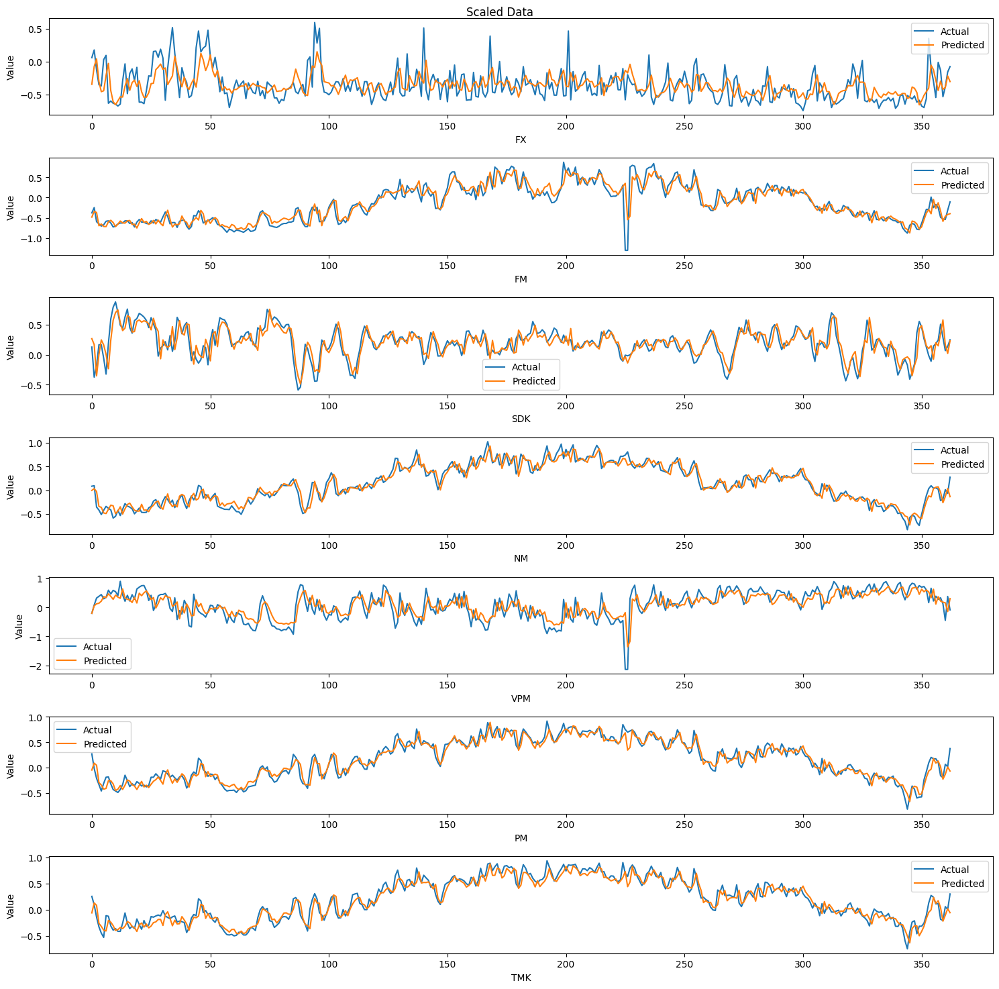

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.plot(testY[:, i], label='Actual')
    plt.plot(pred_VARNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data

In [ ]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(VAR_train.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [ ]:
unscaled_VARNN = unscale(pred_VARNN)
originY = unscale(testY)

In [ ]:
for i in range(num_outputs):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_VARNN)}')

MSE for FX: 14.050112205478367
MSE for FM: 2.715208354282622
MSE for SDK: 15.693765413857268
MSE for NM: 5.038118214067479
MSE for VPM: 93.24258044305002
MSE for PM: 3.599939828725637
MSE for TMK: 3.988001343632402
MSE total: 19.761103686156254


In [ ]:
for i in range(num_outputs):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_VARNN, squared=False)}')

RMSE for FX: 3.748347930152478
RMSE for FM: 1.647788928923429
RMSE for SDK: 3.9615357393133874
RMSE for NM: 2.244575285898755
RMSE for VPM: 9.656219780175368
RMSE for PM: 1.897350739511711
RMSE for TMK: 1.9969980830317295
RMSE total: 3.593259498143837


In [ ]:
for i in range(num_outputs):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_VARNN)}')

MAE for FX: 2.8417999209779685
MAE for FM: 1.0716006179158024
MAE for SDK: 3.0053620343168856
MAE for NM: 1.7467442706596752
MAE for VPM: 7.415600088450534
MAE for PM: 1.4427914383757048
MAE for TMK: 1.5561187323857582
MAE total: 2.7257167290117614


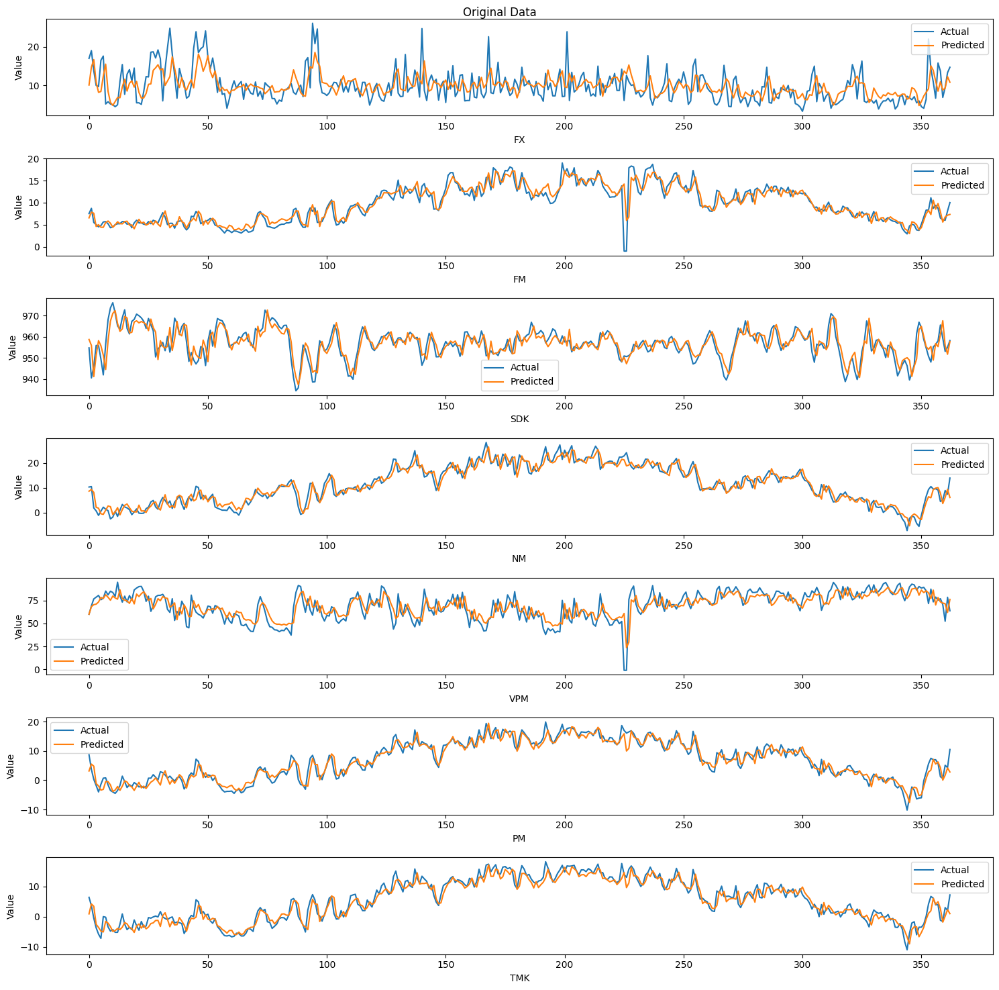

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_VARNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## SrVAR
### Define model

In [ ]:
class LSTMEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(LSTMEncoder, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)

    def forward(self, x):
        _, (h_n, _) = self.lstm(x)
        return h_n[-1]  # Vector trạng thái cuối

In [ ]:
class StateRegularizedUnit(nn.Module):
    def __init__(self, hidden_dim, num_states, tau=1.0):
        super(StateRegularizedUnit, self).__init__()
        self.state_encodings = nn.Parameter(torch.randn(num_states, hidden_dim))
        self.tau = tau

    def forward(self, u_t):
        # Tính điểm gần gũi (Proximity scores)
        proximity_scores = torch.matmul(u_t, self.state_encodings.T)  # Công thức (2) 
        alpha = torch.softmax(proximity_scores / self.tau, dim=-1)  # Công thức (4) 

        # Tính trạng thái h_t dựa trên phân phối alpha
        h_t = torch.matmul(alpha, self.state_encodings)  # Công thức (5)

        # Tính entropy regularization
        entropy_reg = -torch.sum(alpha * torch.log(alpha + 1e-10), dim=-1).mean() # Công thức (6)

        return h_t, alpha, entropy_reg

In [ ]:
class GraphGeneration(nn.Module):
    def __init__(self, hidden_dim, num_vars):
        super(GraphGeneration, self).__init__()
        self.g_a = nn.Linear(hidden_dim, num_vars * num_vars)
        self.g_d = nn.Linear(hidden_dim, num_vars)

    def forward(self, c_st):
        # Sinh ma trận DAG (Adjacency matrix A_st)
        A_st = self.g_a(c_st).view(-1, num_vars, num_vars)  # Công thức (10)

        # Sinh ma trận time-lagged (Diagonal matrix D_st)
        D_st = torch.diag_embed(self.g_d(c_st))  # Công thức (11)

        # Ràng buộc tính không chu kỳ (Acyclicity constraint)
        exp_A = torch.matrix_exp(A_st * A_st)  # Tính ma trận mũ của A_st * A_st, nếu có chu kì thì exp_A sẽ cao [batch_size, num_vars, num_vars]
        trace_exp_A = torch.sum(torch.diagonal(exp_A, dim1=-2, dim2=-1), dim=-1)  # Tính trace cho từng ma trận trong batch [batch_size,] = torch.trace
        acyclic_penalty = torch.mean(trace_exp_A - A_st.size(-1))  # Tổng hợp thành scalar [batch_sỉze]

        return A_st, D_st, acyclic_penalty

In [ ]:
class DynamicVAR(nn.Module):
    def __init__(self, num_vars):
        super(DynamicVAR, self).__init__()
        self.var_weights = nn.Parameter(torch.randn(num_vars, num_vars))

    def forward(self, x_t, A_st, D_st):
        batch_size = x_t.size(0)
        x_t = x_t.unsqueeze(-1)

        # Tính toán từ ma trận adjacency (x_hat_A)
        x_hat_A = torch.matmul(A_st, x_t).squeeze(-1)

        # Tính toán từ ma trận time-lagged (x_hat_D)
        weighted_x_t = torch.matmul(self.var_weights, x_t.squeeze(-1).unsqueeze(-1)).squeeze(-1)
        x_hat_D = torch.matmul(D_st, weighted_x_t.unsqueeze(-1)).squeeze(-1)

        # Tổng hợp dự đoán
        x_hat = x_hat_A + x_hat_D
        return x_hat

In [ ]:
class SrVARModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_states, num_vars, tau=10.0):
        super(SrVARModel, self).__init__()
        self.encoder = LSTMEncoder(input_dim, hidden_dim)
        self.state_regularized_unit = StateRegularizedUnit(hidden_dim, num_states, tau)
        self.graph_generation = GraphGeneration(hidden_dim, num_vars)
        self.dynamic_var = DynamicVAR(num_vars)

    def forward(self, x):
        u_t = self.encoder(x)  # Bước 1
        h_t, alpha, entropy_reg = self.state_regularized_unit(u_t)  # Bước 2
        A_st, D_st, acyclic_penalty = self.graph_generation(h_t)  # Bước 3
        x_hat = self.dynamic_var(x[:, -1, :], A_st, D_st)  # Bước 4

        return x_hat, alpha, entropy_reg, acyclic_penalty

In [ ]:
def train_srvarm(model, trainX, trainY, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0):

    # Optimizer và Loss function
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    # Lagrangian parameters
    rho = 1.0
    lagrangian_multiplier = 0.0
    max_rho = 10.0

    # Lưu lịch sử mất mát
    train_loss_history = []
    val_loss_history = []

    for epoch in range(num_epochs):
        model.train()
        train_epoch_loss = 0

        # Huấn luyện
        for i in range(0, len(trainX), batch_size):
            # Lấy batch và chuyển về device
            batch_x = torch.tensor(trainX[i:i + batch_size], dtype=torch.float32)
            batch_y = torch.tensor(trainY[i:i + batch_size], dtype=torch.float32)

            # Forward pass
            x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_x)

            # Tính hàm mất mát
            loss = (
                mse_loss(x_hat, batch_y)
                + 0.01 * entropy_reg
                + rho / 2 * acyclic_penalty.pow(2).mean()
                + lagrangian_multiplier * acyclic_penalty.mean()
            )

            # Backward pass và update
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_epoch_loss += loss.item()

        # Tính mất mát trung bình trên tập huấn luyện
        train_avg_loss = train_epoch_loss / (len(trainX) / batch_size)
        train_loss_history.append(train_avg_loss)

        # Đánh giá trên tập validation
        model.eval()
        val_epoch_loss = 0
        with torch.no_grad():
            for i in range(0, len(valX), batch_size):
                batch_val_x = torch.tensor(valX[i:i + batch_size], dtype=torch.float32)
                batch_val_y = torch.tensor(valY[i:i + batch_size], dtype=torch.float32)

                # Forward pass
                x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_val_x)

                # Tính hàm mất mát validation
                val_loss = mse_loss(x_hat, batch_val_y) + 0.01 * entropy_reg
                val_epoch_loss += val_loss.item()

        # Tính mất mát trung bình trên tập validation
        val_avg_loss = val_epoch_loss / (len(valX) / batch_size)
        val_loss_history.append(val_avg_loss)

        # Log thông tin
        if verbose == 1:
            if (epoch + 1) % 10 == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_avg_loss:.4f}, Val Loss: {val_avg_loss:.4f}")

    return model, train_loss_history, val_loss_history

In [ ]:
# Chia dữ liệu thành train và validation
Xtrain, valX, Ytrain, valY = train_test_split(trainX, trainY, test_size=0.2, random_state=42)

input_dim = trainX.shape[2]
hidden_dim = 64
num_vars = trainX.shape[2]

for num_states in range(1, 6):
    model = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)
    trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
        model, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0
    )

    print(f"num_states: {num_states}, train_loss: {train_loss_history_SrVAR[-1]}, val_loss: {val_loss_history_SrVAR[-1]}")

num_states: 1, train_loss: 0.062060033098310874, val_loss: 0.04108637652985037
num_states: 2, train_loss: 0.033147936164053725, val_loss: 0.03821115073275893
num_states: 3, train_loss: 0.03468603550620345, val_loss: 0.03974573416252659
num_states: 4, train_loss: 0.03306145008029856, val_loss: 0.03782980144023895
num_states: 5, train_loss: 0.0349470269014907, val_loss: 0.04058953833906618


In [ ]:
# Model parameters
num_states = 2

# Instantiate the model
model_SrVAR = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)

start = time.time()
trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
    model_SrVAR, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.01, tau=1.0, verbose=1
)
end = time.time()

# Log training time
print(f"Training completed in {end - start:.2f} seconds")

Epoch 10/100, Train Loss: 0.0414, Val Loss: 0.0493
Epoch 20/100, Train Loss: 0.0410, Val Loss: 0.0483
Epoch 30/100, Train Loss: 0.0406, Val Loss: 0.0469
Epoch 40/100, Train Loss: 0.0400, Val Loss: 0.0476
Epoch 50/100, Train Loss: 0.0391, Val Loss: 0.0475
Epoch 60/100, Train Loss: 0.0384, Val Loss: 0.0469
Epoch 70/100, Train Loss: 0.0366, Val Loss: 0.0440
Epoch 80/100, Train Loss: 0.0345, Val Loss: 0.0431
Epoch 90/100, Train Loss: 0.0315, Val Loss: 0.0437
Epoch 100/100, Train Loss: 0.0294, Val Loss: 0.0443
Training completed in 21.90 seconds


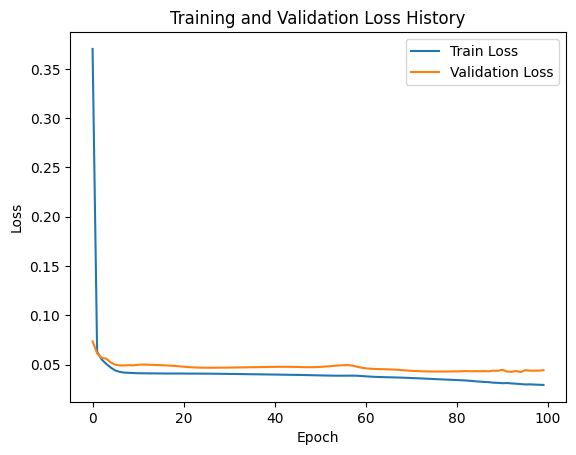

In [ ]:
plt.plot(train_loss_history_SrVAR, label="Train Loss")
plt.plot(val_loss_history_SrVAR, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss History")
plt.legend()
plt.show()

In [ ]:
model_SrVAR.eval()  # Đặt mô hình ở chế độ đánh giá
predictions_SrVAR = []
batch_size = 32
n_features = 7

with torch.no_grad():  # Không cần tính gradient trong chế độ dự đoán
    for i in range(0, len(testX), batch_size):
        # Lấy batch từ testX và chuyển về device
        batch_x = torch.tensor(testX[i:i+batch_size], dtype=torch.float32)

        # Dự đoán với mô hình
        batch_pred, _, _, _ = model_SrVAR(batch_x)  # Nếu forward của model trả về nhiều giá trị

        # Chuyển kết quả về CPU và thêm vào danh sách predictions
        predictions_SrVAR.append(batch_pred.cpu().numpy())

# Kết hợp danh sách predictions thành một mảng numpy
predictions_SrVAR = np.concatenate(predictions_SrVAR, axis=0)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, predictions_SrVAR)}')

MSE for FX: 0.0536727862550178
MSE for FM: 0.03794583368148822
MSE for SDK: 0.02485275963898603
MSE for NM: 0.01895228095629683
MSE for VPM: 0.1116693586941751
MSE for PM: 0.012721179053258466
MSE for TMK: 0.015356270364748006
MSE total: 0.03931006694913863


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], predictions_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, predictions_SrVAR, squared=False)}')

RMSE for FX: 0.23167387909520099
RMSE for FM: 0.19479690367531055
RMSE for SDK: 0.1576475805047005
RMSE for NM: 0.13766728353641916
RMSE for VPM: 0.33416965555564004
RMSE for PM: 0.11278820440657111
RMSE for TMK: 0.12392041948261798
RMSE total: 0.18466627517949433


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, predictions_SrVAR)}')

MAE for FX: 0.17226892135834515
MAE for FM: 0.12328749727861571
MAE for SDK: 0.1235535724490708
MAE for NM: 0.10795944005203055
MAE for VPM: 0.2572714808163311
MAE for PM: 0.08672710066484123
MAE for TMK: 0.0954624725778435
MAE total: 0.13807578359958259


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'R2 total: {r2_score(testY, predictions_SrVAR)}')

R2 for FX: 0.14354159921129717
R2 for FM: 0.8125741267328999
R2 for SDK: 0.5936228172614234
R2 for NM: 0.8813377821534237
R2 for VPM: 0.5090833802910544
R2 for PM: 0.9125679369488566
R2 for TMK: 0.9020015672772828
R2 total: 0.6792470299823199


In [ ]:
unscaled_SrVAR = unscale(predictions_SrVAR)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_SrVAR)}')

MSE for FX: 15.511435159830715
MSE for FM: 3.2117353097573713
MSE for SDK: 20.115869390132914
MSE for NM: 6.913981814104767
MSE for VPM: 110.80391736604047
MSE for PM: 3.851464367509536
MSE for TMK: 4.622582779976112
MSE total: 23.575855169621708


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_SrVAR, squared=False)}')

RMSE for FX: 3.938455936002168
RMSE for FM: 1.792131499013778
RMSE for SDK: 4.485071837789548
RMSE for NM: 2.6294451532794456
RMSE for VPM: 10.526343969586044
RMSE for PM: 1.9625148069529401
RMSE for TMK: 2.1500192510710483
RMSE total: 3.926283207670711


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_SrVAR)}')

MAE for FX: 2.9285716412481198
MAE for FM: 1.1342449798810579
MAE for SDK: 3.5150956452845175
MAE for NM: 2.062025335344894
MAE for VPM: 8.104051513671875
MAE for PM: 1.5090516065968298
MAE for TMK: 1.65627386834432
MAE total: 2.9870449414816598


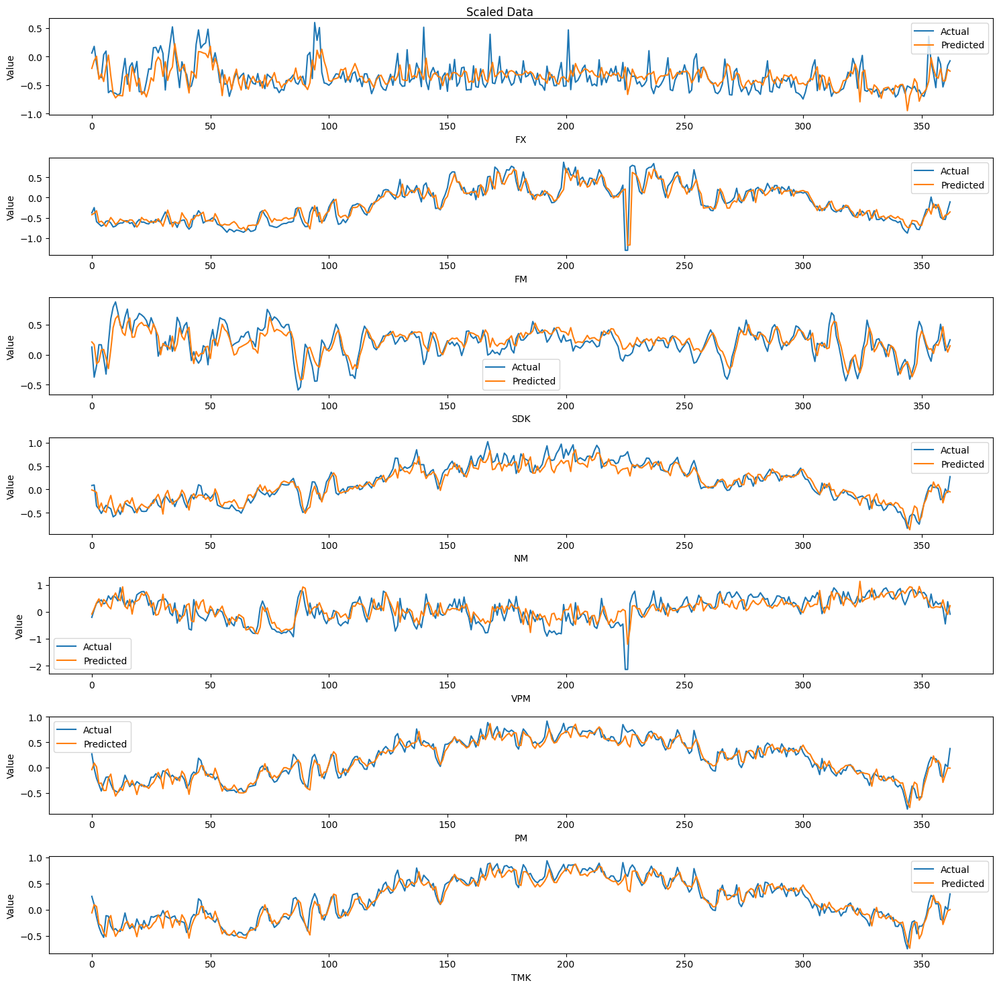

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(testY[:, i], label='Actual')
    plt.plot(predictions_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

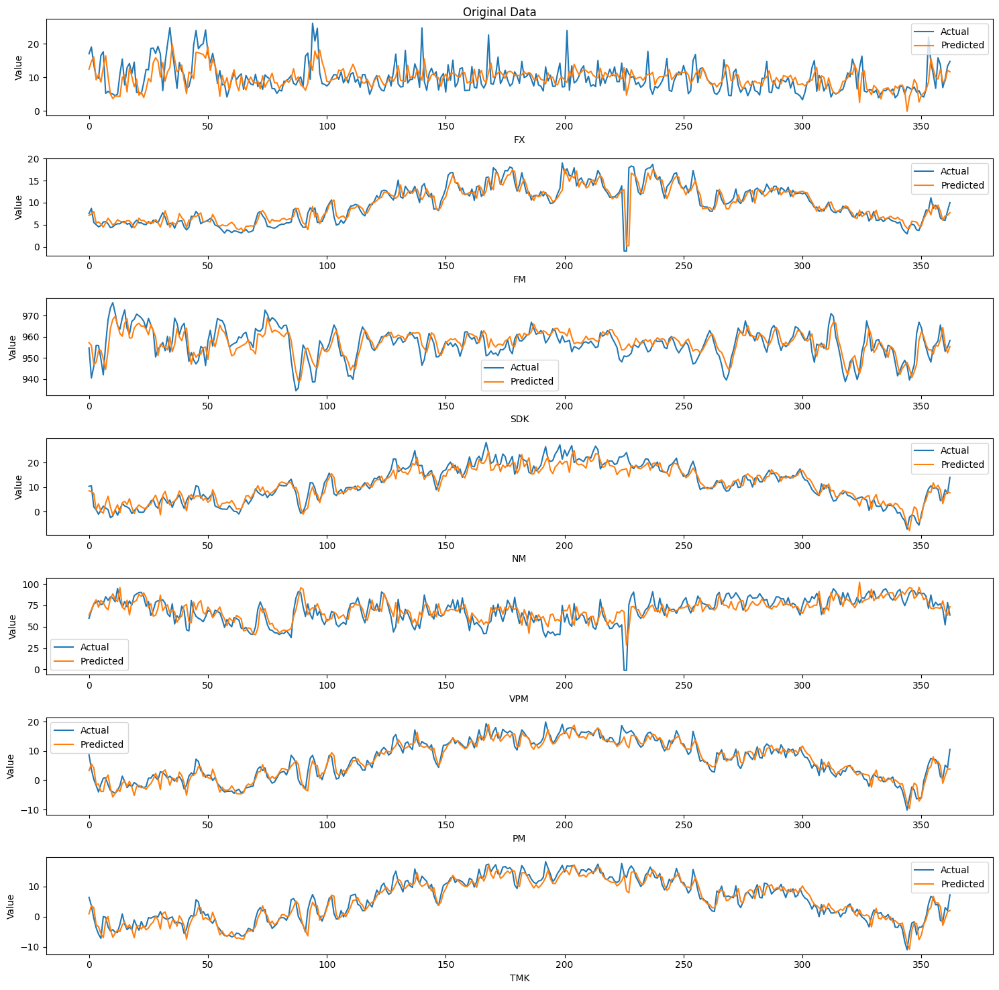

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()